## Seis imagens de coloração de domínio 

GERANDO FLEXÁGONO DE 6 FACES - EDIÇÃO ENIMAR 2026
Gerando flexágono com n = 6...

Processando Face 1...
  ✓ Salvo: flexagono_face_1_Face_1.png

Processando Face 2...
  ✓ Salvo: flexagono_face_2_Face_2.png

Processando Face 3...
  ✓ Salvo: flexagono_face_3_Face_3.png

Processando Face 4...
  ✓ Salvo: flexagono_face_4_Face_4.png

Processando Face 5...
  ✓ Salvo: flexagono_face_5_Face_5.png

Processando Face 6...
  ✓ Salvo: flexagono_face_6_Face_6.png

✅ Todas as 6 faces foram geradas com sucesso!

Gerando visualização em grade...
Renderizando face 1...
Renderizando face 2...
Renderizando face 3...
Renderizando face 4...
Renderizando face 5...
Renderizando face 6...

✓ Grade salva como 'flexagono_grade_n6.png'


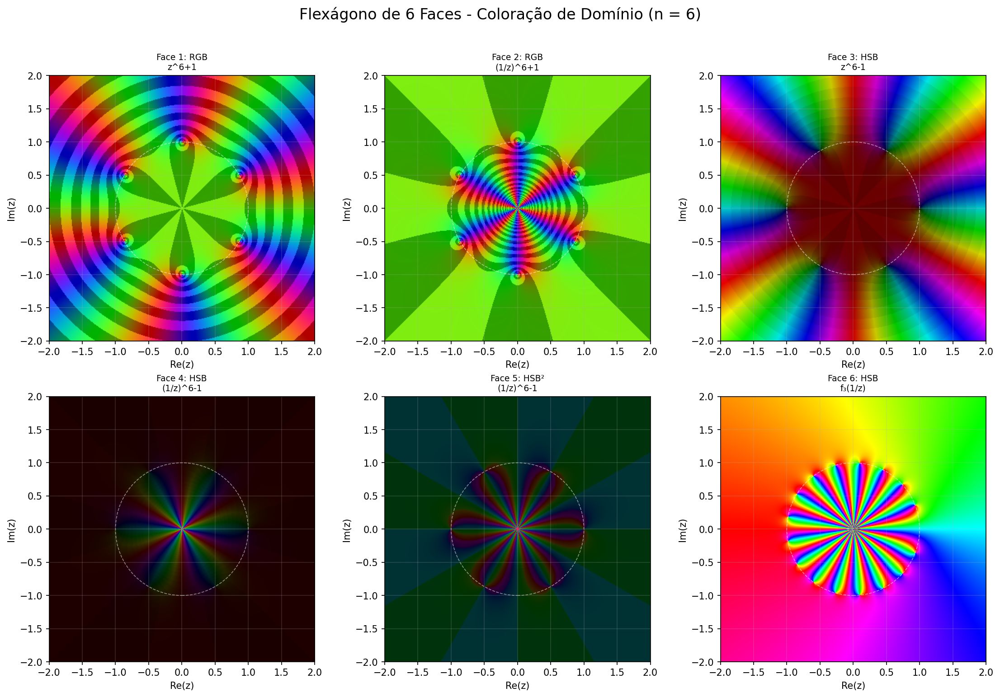


✨ TRABALHO CONCLUÍDO COM SUCESSO!

Arquivos gerados:
  - 6 imagens individuais (flexagono_face_X.png)
  - 1 imagem em grade (flexagono_grade_n6.png)

Dica: Para melhor resultado na impressão, use as imagens
individuais com resolução de 300 DPI.


In [18]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb
import warnings
warnings.filterwarnings('ignore')

# Configuração para imagens quadradas de alta qualidade
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300

# ============================================
# PALETAS DE CORES
# ============================================

def hsv_standard(z):
    """
    Paleta HSB padrão: H = argumento, S = 1, V = 1
    """
    # Matiz (Hue) baseado no argumento 
    hue = (np.angle(z) + np.pi) / (2 * np.pi)
    # Saturação máxima
    saturation = np.ones_like(hue)
    # Valor (brilho) máximo
    value = np.ones_like(hue)
    
    return hue, saturation, value

def hsv_enhanced(z, n_levels=12):
    """
    Paleta HSB aprimorada mostrando curvas de nível do módulo
    H = argumento, S = 1, V = função piso de log|f|
    """
    # Matiz baseado no argumento
    hue = (np.angle(z) + np.pi) / (2 * np.pi)
    
    # Saturação máxima
    saturation = np.ones_like(hue)
    
    # Brilho baseado nas curvas de nível do módulo
    modulus = np.abs(z)
    # Evitar log(0)
    log_mod = np.log(modulus + 1e-10)
    # Função piso para criar curvas de nível
    # Normalizar para ficar entre 0 e 1
    levels = np.floor(log_mod * n_levels / (2 * np.pi)) 
    value = (levels - levels.min()) / (levels.max() - levels.min() + 1e-10)
    value = np.clip(value, 0.1, 1.0)  # Evitar muito escuro
    
    return hue, saturation, value

def hsv_double_enhanced(z, n_levels_mod=12, n_levels_arg=12):
    """
    Paleta HSB duplamente aprimorada mostrando curvas de nível do módulo e do argumento
    H = fase, S = 1, V = piso(log|f|) e H também modulado por piso(arg)
    """
    # Matiz baseado no argumento com curvas de nível
    arg = np.angle(z)
    hue_arg = (arg + np.pi) / (2 * np.pi)
    
    # Criar curvas de nível para o argumento
    arg_levels = np.floor(arg * n_levels_arg / (2 * np.pi))
    hue = (hue_arg + arg_levels / n_levels_arg) % 1.0
    
    # Saturação máxima
    saturation = np.ones_like(hue)
    
    # Brilho baseado nas curvas de nível do módulo
    modulus = np.abs(z)
    log_mod = np.log(modulus + 1e-10)
    mod_levels = np.floor(log_mod * n_levels_mod / (2 * np.pi))
    value = (mod_levels - mod_levels.min()) / (mod_levels.max() - mod_levels.min() + 1e-10)
    value = np.clip(value, 0.2, 1.0)
    
    return hue, saturation, value

def rgb_enhanced(z, n_levels=12):
    """
    Paleta RGB aprimorada mostrando curvas de nível do módulo
    Baseada em https://github.com/jcponce/complex/blob/gh-pages/dctools/domaincoloring.js
    """
    arg = np.angle(z)
    modulus = np.abs(z)
    
    # Mapear argumento para RGB usando senos e cossenos
    # Isso cria uma transição suave de cores
    r = (np.sin(arg) + 1) / 2
    g = (np.sin(arg + 2*np.pi/3) + 1) / 2
    b = (np.sin(arg + 4*np.pi/3) + 1) / 2
    
    # Curvas de nível do módulo (como listras escuras)
    log_mod = np.log(modulus + 1e-10)
    levels = np.floor(log_mod * n_levels / (2 * np.pi))
    # Criar um padrão de listras
    stripe = (levels % 2) * 0.3  # Escurece a cada nível
    
    # Aplicar as listras
    r = np.clip(r - stripe, 0, 1)
    g = np.clip(g - stripe, 0, 1)
    b = np.clip(b - stripe, 0, 1)
    
    # Converter para formato HSV-like mas retornando RGB
    # Para compatibilidade com a função de plotagem
    # Vamos converter RGB para HSV
    rgb_stack = np.stack([r, g, b], axis=-1)
    
    # Converter RGB para HSV (implementação manual)
    max_rgb = np.max(rgb_stack, axis=-1)
    min_rgb = np.min(rgb_stack, axis=-1)
    diff = max_rgb - min_rgb
    
    # Hue
    hue = np.zeros_like(max_rgb)
    mask = diff > 0
    r_eq_max = (r == max_rgb) & mask
    g_eq_max = (g == max_rgb) & mask
    b_eq_max = (b == max_rgb) & mask
    
    hue[r_eq_max] = ((g[r_eq_max] - b[r_eq_max]) / diff[r_eq_max]) % 6
    hue[g_eq_max] = ((b[g_eq_max] - r[g_eq_max]) / diff[g_eq_max] + 2) % 6
    hue[b_eq_max] = ((r[b_eq_max] - g[b_eq_max]) / diff[b_eq_max] + 4) % 6
    hue = hue / 6
    
    # Saturation
    saturation = np.zeros_like(max_rgb)
    saturation[max_rgb > 0] = diff[max_rgb > 0] / max_rgb[max_rgb > 0]
    
    # Value
    value = max_rgb
    
    return hue, saturation, value

# ============================================
# FUNÇÕES PARA O FLEXÁGONO
# ============================================

def f1(z, n=6):
    """f_1(z) = z^n + 1"""
    return z**n + 1

def f2(z, n=6):
    """f_2(z) = z^n - 1"""
    return z**n - 1

def f3(z):
    """f_3(z) = (z^18 - z)/(z - 1) - simplificada para evitar singularidade"""
    # A função original tem uma singularidade removível em z=1
    # Para z próximo de 1, usamos a expansão
    epsilon = 1e-10
    mask = np.abs(z - 1) < epsilon
    result = np.zeros_like(z, dtype=complex)
    
    # Para z longe de 1
    result[~mask] = (z[~mask]**18 - z[~mask]) / (z[~mask] - 1)
    
    # Para z próximo de 1, o limite é 18 (derivada de z^18 - z em z=1)
    result[mask] = 18
    
    return result

def criar_dominio(xmin=-2, xmax=2, ymin=-2, ymax=2, resolucao=500):
    """Cria o grid de pontos no plano complexo"""
    x = np.linspace(xmin, xmax, resolucao)
    y = np.linspace(ymin, ymax, resolucao)
    X, Y = np.meshgrid(x, y)
    Z = X + 1j * Y
    return Z

def plot_domain_coloring(Z, title="", figsize=(8, 8), colormap_func=hsv_standard, **kwargs):
    """
    Gera o gráfico de coloração de domínio
    """
    # Calcular cores usando a função de colormap escolhida
    hue, saturation, value = colormap_func(Z, **kwargs)
    
    # Converter para RGB
    rgb = hsv_to_rgb(np.stack([hue, saturation, value], axis=-1))
    
    # Criar figura quadrada
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(rgb, extent=[-2, 2, -2, 2], origin='lower', aspect='equal')
    
    # Configurações
    ax.set_xlabel('Re(z)', fontsize=12)
    ax.set_ylabel('Im(z)', fontsize=12)
    ax.set_title(title, fontsize=14, pad=20)
    ax.grid(True, alpha=0.2, linestyle='--')
    ax.set_xlim([-2, 2])
    ax.set_ylim([-2, 2])
    
    # Adicionar círculo unitário
    circle = plt.Circle((0, 0), 1, fill=False, edgecolor='white', 
                        linewidth=1, alpha=0.5, linestyle='--')
    ax.add_patch(circle)
    
    # Adicionar eixos
    ax.axhline(y=0, color='white', linewidth=0.5, alpha=0.3)
    ax.axvline(x=0, color='white', linewidth=0.5, alpha=0.3)
    
    plt.tight_layout()
    return fig, ax

# ============================================
# CONFIGURAÇÃO DAS 6 FACES DO FLEXÁGONO
# ============================================

def gerar_faces_flexagono(n=6, resolucao=500):
    """
    Gera as 6 faces do flexágono conforme especificação
    
    Parâmetros:
    - n: expoente para as funções (padrão=6)
    - resolucao: resolução da imagem (padrão=500)
    """
    
    # Definir domínio
    Z = criar_dominio(-2, 2, -2, 2, resolucao)
    
    # Configurações das faces
    faces_config = [
        {
            'nome': 'Face 1',
            'titulo': f'Face 1: f₁(z) = z^{n} + 1\nPaleta RGB Aprimorada (curvas de nível do módulo)',
            'funcao': f1,
            'colormap': rgb_enhanced,
            'kwargs': {'n_levels': 12},
            'usa_1z': False
        },
        {
            'nome': 'Face 2',
            'titulo': f'Face 2: g₁(z) = f₁(1/z) = (1/z)^{n} + 1\nPaleta RGB Aprimorada (curvas de nível do módulo)',
            'funcao': f1,
            'colormap': rgb_enhanced,
            'kwargs': {'n_levels': 12},
            'usa_1z': True
        },
        {
            'nome': 'Face 3',
            'titulo': f'Face 3: f₂(z) = z^{n} - 1\nPaleta HSB Aprimorada (curvas de nível do módulo)',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'kwargs': {'n_levels': 12},
            'usa_1z': False
        },
        {
            'nome': 'Face 4',
            'titulo': f'Face 4: g₂(z) = f₂(1/z) = (1/z)^{n} - 1\nPaleta HSB Aprimorada (curvas de nível do módulo)',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'kwargs': {'n_levels': 12},
            'usa_1z': True
        },
        {
            'nome': 'Face 5',
            'titulo': f'Face 5: g₂(z) = f₂(1/z) = (1/z)^{n} - 1\nPaleta HSB Duplamente Aprimorada (curvas de nível do módulo e argumento)',
            'funcao': f2,
            'colormap': hsv_double_enhanced,
            'kwargs': {'n_levels_mod': 12, 'n_levels_arg': 8},
            'usa_1z': True
        },
        {
            'nome': 'Face 6',
            'titulo': 'Face 6: g₃(z) = f₃(1/z), onde f₃(z) = (z¹⁸ - z)/(z - 1)\nPaleta HSB Padrão',
            'funcao': f3,
            'colormap': hsv_standard,
            'kwargs': {},
            'usa_1z': True
        }
    ]
    
    figuras = []
    
    print(f"Gerando flexágono com n = {n}...")
    print("="*60)
    
    for i, config in enumerate(faces_config, 1):
        print(f"\nProcessando {config['nome']}...")
        
        # Aplicar função e transformação 1/z se necessário
        if config['usa_1z']:
            # Para evitar divisão por zero
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            W = config['funcao'](1/Z_use, n) if 'n' in config['funcao'].__code__.co_varnames else config['funcao'](1/Z_use)
        else:
            W = config['funcao'](Z, n) if 'n' in config['funcao'].__code__.co_varnames else config['funcao'](Z)
        
        # Aplicar colormap
        if config['colormap'] == rgb_enhanced:
            # Para RGB enhanced, precisamos passar Z ao invés de W? 
            # A paleta RGB usa o argumento e módulo da função
            Z_for_color = W
            hue, sat, val = config['colormap'](Z_for_color, **config['kwargs'])
        else:
            hue, sat, val = config['colormap'](W, **config['kwargs'])
        
        # Criar figura
        fig, ax = plt.subplots(figsize=(8, 8))
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        ax.imshow(rgb, extent=[-2, 2, -2, 2], origin='lower', aspect='equal')
        ax.set_xlabel('Re(z)', fontsize=12)
        ax.set_ylabel('Im(z)', fontsize=12)
        ax.set_title(config['titulo'], fontsize=10, pad=20)
        ax.grid(True, alpha=0.2, linestyle='--')
        ax.set_xlim([-2, 2])
        ax.set_ylim([-2, 2])
        
        # Adicionar círculo unitário
        circle = plt.Circle((0, 0), 1, fill=False, edgecolor='white', 
                           linewidth=1, alpha=0.5, linestyle='--')
        ax.add_patch(circle)
        
        # Adicionar eixos
        ax.axhline(y=0, color='white', linewidth=0.5, alpha=0.3)
        ax.axvline(x=0, color='white', linewidth=0.5, alpha=0.3)
        
        plt.tight_layout()
        
        # Salvar figura
        filename = f'flexagono_face_{i}_{config["nome"].replace(" ", "_")}.png'
        fig.savefig(filename, bbox_inches='tight', dpi=300)
        print(f"  ✓ Salvo: {filename}")
        
        figuras.append(fig)
        plt.close(fig)
    
    print("\n" + "="*60)
    print("✅ Todas as 6 faces foram geradas com sucesso!")
    return figuras

# ============================================
# VISUALIZAÇÃO EM GRADE
# ============================================

def mostrar_grade_flexagono(n=6, resolucao=400):
    """
    Mostra todas as 6 faces em uma única figura (2x3)
    """
    Z = criar_dominio(-2, 2, -2, 2, resolucao)
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    faces_config = [
        {'funcao': f1, 'colormap': rgb_enhanced, 'kwargs': {'n_levels': 12}, 'usa_1z': False, 'nome': f'z^{n}+1', 'tipo': 'RGB'},
        {'funcao': f1, 'colormap': rgb_enhanced, 'kwargs': {'n_levels': 12}, 'usa_1z': True, 'nome': f'(1/z)^{n}+1', 'tipo': 'RGB'},
        {'funcao': f2, 'colormap': hsv_enhanced, 'kwargs': {'n_levels': 12}, 'usa_1z': False, 'nome': f'z^{n}-1', 'tipo': 'HSB'},
        {'funcao': f2, 'colormap': hsv_enhanced, 'kwargs': {'n_levels': 12}, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB'},
        {'funcao': f2, 'colormap': hsv_double_enhanced, 'kwargs': {'n_levels_mod': 12, 'n_levels_arg': 8}, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB²'},
        {'funcao': f3, 'colormap': hsv_standard, 'kwargs': {}, 'usa_1z': True, 'nome': 'f₃(1/z)', 'tipo': 'HSB'}
    ]
    
    for idx, config in enumerate(faces_config):
        print(f"Renderizando face {idx+1}...")
        
        if config['usa_1z']:
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            if config['funcao'] == f3:
                W = config['funcao'](1/Z_use)
            else:
                W = config['funcao'](1/Z_use, n)
        else:
            W = config['funcao'](Z, n) if config['funcao'] != f3 else config['funcao'](Z)
        
        if config['colormap'] == rgb_enhanced:
            hue, sat, val = config['colormap'](W, **config['kwargs'])
        else:
            hue, sat, val = config['colormap'](W, **config['kwargs'])
        
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        axes[idx].imshow(rgb, extent=[-2, 2, -2, 2], origin='lower', aspect='equal')
        axes[idx].set_title(f'Face {idx+1}: {config["tipo"]}\n{config["nome"]}', fontsize=9)
        axes[idx].set_xlabel('Re(z)')
        axes[idx].set_ylabel('Im(z)')
        axes[idx].grid(True, alpha=0.2)
        
        # Adicionar círculo unitário
        circle = plt.Circle((0, 0), 1, fill=False, edgecolor='white', 
                           linewidth=0.8, alpha=0.5, linestyle='--')
        axes[idx].add_patch(circle)
    
    plt.suptitle(f'Flexágono de 6 Faces - Coloração de Domínio (n = {n})', fontsize=16, y=1.02)
    plt.tight_layout()
    
    # Salvar grade
    fig.savefig(f'flexagono_grade_n{n}.png', bbox_inches='tight', dpi=300)
    print(f"\n✓ Grade salva como 'flexagono_grade_n{n}.png'")
    plt.show()
    
    return fig

# ============================================
# FUNÇÃO PARA TESTAR DIFERENTES VALORES DE N
# ============================================

def testar_diferentes_n(valores_n=[4, 5, 6, 7, 8], resolucao=300):
    """
    Testa o flexágono para diferentes valores de n
    """
    for n in valores_n:
        print(f"\n{'='*60}")
        print(f"Testando n = {n}")
        print(f"{'='*60}")
        gerar_faces_flexagono(n=n, resolucao=resolucao)
        mostrar_grade_flexagono(n=n, resolucao=resolucao)

# ============================================
# EXECUÇÃO PRINCIPAL
# ============================================

if __name__ == "__main__":
    print("="*60)
    print("GERANDO FLEXÁGONO DE 6 FACES - EDIÇÃO ENIMAR 2026")
    print("="*60)
    
    # Parâmetros
    n = 6  # Valor padrão (pode mudar para 4,5,7,8 etc.)
    resolucao = 500  # Alta resolução para impressão
    
    # Gerar as 6 faces
    figuras = gerar_faces_flexagono(n=n, resolucao=resolucao)
    
    # Mostrar grade 2x3
    print("\nGerando visualização em grade...")
    fig_grade = mostrar_grade_flexagono(n=n, resolucao=400)
    
    print("\n" + "="*60)
    print("✨ TRABALHO CONCLUÍDO COM SUCESSO!")
    print("="*60)
    print("\nArquivos gerados:")
    print("  - 6 imagens individuais (flexagono_face_X.png)")
    print("  - 1 imagem em grade (flexagono_grade_n6.png)")
    print("\nDica: Para melhor resultado na impressão, use as imagens")
    print("individuais com resolução de 300 DPI.")

In [22]:
np.angle(-1+1*1j, deg=True)

135.0

GERANDO FLEXÁGONO DE 6 FACES - VERSÃO CORRIGIDA

Usando paleta RGB em tons pastel (mais claros e suaves)
Gerando flexágono com n = 6...

Processando Face 1...
  ✓ Salvo: flexagono_face_1_Face_1.png

Processando Face 2...
  ✓ Salvo: flexagono_face_2_Face_2.png

Processando Face 3...
  ✓ Salvo: flexagono_face_3_Face_3.png

Processando Face 4...
  ✓ Salvo: flexagono_face_4_Face_4.png

Processando Face 5...
  ✓ Salvo: flexagono_face_5_Face_5.png

Processando Face 6...
  ✓ Salvo: flexagono_face_6_Face_6.png

✅ Todas as 6 faces foram geradas com sucesso!

Gerando visualização em grade...
Renderizando face 1...
Renderizando face 2...
Renderizando face 3...
Renderizando face 4...
Renderizando face 5...
Renderizando face 6...

✓ Grade salva como 'flexagono_grade_n6.png'


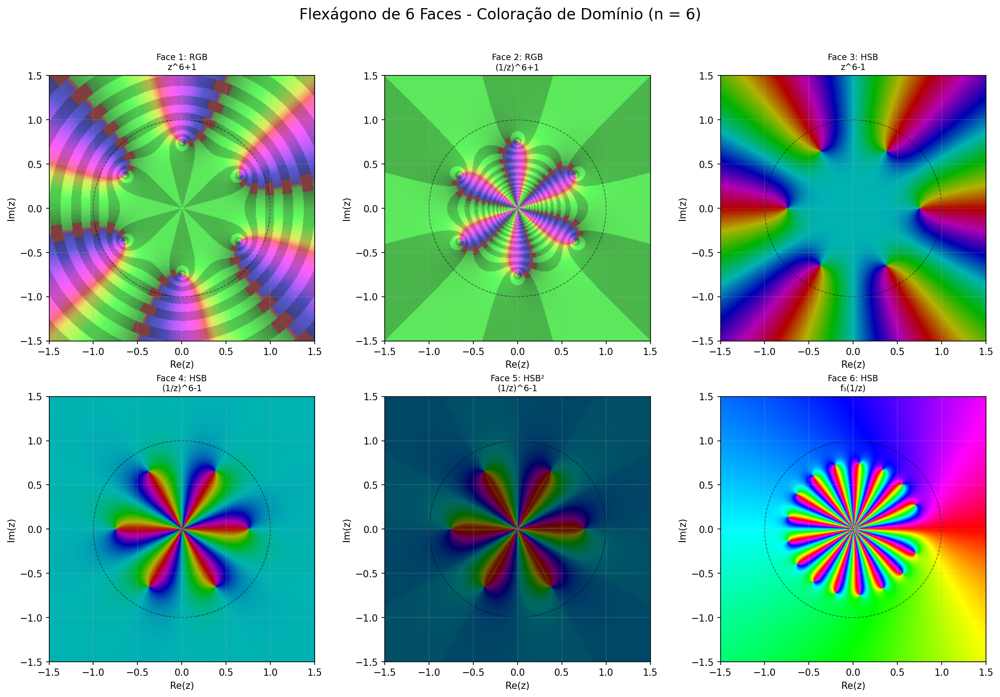


✨ TRABALHO CONCLUÍDO!


In [27]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb
import warnings
warnings.filterwarnings('ignore')

# Configuração para imagens quadradas de alta qualidade
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300

# ============================================
# PALETAS DE CORES CORRIGIDAS
# ============================================

def hsv_standard(z):
    """
    Paleta HSB padrão: H = argumento, S = 1, V = 1
    CORREÇÃO: argumento 0 = vermelho, π = ciano, 2π = vermelho
    """
    # Obter argumento no intervalo [0, 2π)
    arg = np.angle(z)  # Retorna no intervalo [-π, π]
    # Converter para [0, 2π): se negativo, somar 2π
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    
    # Matiz: normalizar para [0, 1]
    # 0 rad = vermelho, π rad = ciano, 2π rad = vermelho
    hue = arg / (2 * np.pi)
    
    # Saturação máxima
    saturation = np.ones_like(hue)
    
    # Valor (brilho) máximo
    value = np.ones_like(hue)
    
    return hue, saturation, value

def hsv_enhanced(z, n_levels=12, min_brightness=0.3):
    """
    Paleta HSB aprimorada mostrando curvas de nível do módulo
    CORREÇÃO: brilho mínimo aumentado para evitar imagens escuras
    """
    # Matiz baseado no argumento (corrigido)
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue = arg / (2 * np.pi)
    
    # Saturação máxima
    saturation = np.ones_like(hue)
    
    # Brilho baseado nas curvas de nível do módulo
    modulus = np.abs(z)
    # Evitar log(0)
    log_mod = np.log(modulus + 1e-10)
    
    # Função piso para criar curvas de nível
    levels = np.floor(log_mod * n_levels / (2 * np.pi))
    
    # Normalizar para ficar entre min_brightness e 1
    max_level = np.max(levels)
    min_level = np.min(levels)
    
    if max_level > min_level:
        value = min_brightness + (1 - min_brightness) * (levels - min_level) / (max_level - min_level)
    else:
        value = min_brightness * np.ones_like(levels)
    
    # Aplicar modulação adicional para criar listras mais visíveis
    # Isso cria um padrão de anéis concêntricos mais definidos
    value = value * (0.7 + 0.3 * np.sin(2 * np.pi * levels / 2))
    value = np.clip(value, min_brightness, 1.0)
    
    return hue, saturation, value

def hsv_double_enhanced(z, n_levels_mod=12, n_levels_arg=8, min_brightness=0.3):
    """
    Paleta HSB duplamente aprimorada mostrando curvas de nível do módulo e do argumento
    CORREÇÃO: brilho mínimo aumentado
    """
    # Matiz baseado no argumento com curvas de nível
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue_arg = arg / (2 * np.pi)
    
    # Criar curvas de nível para o argumento (listras radiais)
    arg_levels = np.floor(arg * n_levels_arg / (2 * np.pi))
    # Modulação do matiz pelas curvas de nível do argumento
    hue = (hue_arg + 0.1 * arg_levels / n_levels_arg) % 1.0
    
    # Saturação máxima
    saturation = np.ones_like(hue)
    
    # Brilho baseado nas curvas de nível do módulo
    modulus = np.abs(z)
    log_mod = np.log(modulus + 1e-10)
    mod_levels = np.floor(log_mod * n_levels_mod / (2 * np.pi))
    
    # Normalizar brilho
    max_level = np.max(mod_levels)
    min_level = np.min(mod_levels)
    
    if max_level > min_level:
        value = min_brightness + (1 - min_brightness) * (mod_levels - min_level) / (max_level - min_level)
    else:
        value = min_brightness * np.ones_like(mod_levels)
    
    # Modulação para anéis mais visíveis
    value = value * (0.7 + 0.3 * np.sin(2 * np.pi * mod_levels / 2))
    value = np.clip(value, min_brightness, 1.0)
    
    return hue, saturation, value

def rgb_enhanced(z, n_levels=12, min_brightness=0.4):
    """
    Paleta RGB aprimorada mostrando curvas de nível do módulo
    CORREÇÃO: Cores mais suaves (rosa claro e verde claro)
    Baseada em https://github.com/jcponce/complex/blob/gh-pages/dctools/domaincoloring.js
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    modulus = np.abs(z)
    
    # Mapear argumento para RGB com cores suaves
    # Usando uma combinação de senos com fases diferentes para obter
    # transições suaves entre rosa claro e verde claro
    
    # Ajuste de fases para obter as cores desejadas
    # Rosa claro: quando sin(arg) é máximo
    # Verde claro: quando sin(arg + 2π/3) é máximo
    # Azul claro: quando sin(arg + 4π/3) é máximo
    
    r = (np.sin(arg - np.pi/6) + 1) / 2
    g = (np.sin(arg - np.pi/2) + 1) / 2  
    b = (np.sin(arg + np.pi/6) + 1) / 2
    
    # Ajustar para tons pastel (mais claros)
    r = 0.6 + 0.4 * r
    g = 0.6 + 0.4 * g
    b = 0.6 + 0.4 * b
    
    # Curvas de nível do módulo (listras escuras mais suaves)
    log_mod = np.log(modulus + 1e-10)
    levels = np.floor(log_mod * n_levels / (2 * np.pi))
    
    # Criar um padrão de listras mais suave
    stripe_intensity = 0.25 * (levels % 2)
    
    # Aplicar as listras
    r = np.clip(r - stripe_intensity, min_brightness, 1)
    g = np.clip(g - stripe_intensity, min_brightness, 1)
    b = np.clip(b - stripe_intensity, min_brightness, 1)
    
    # Converter RGB para HSV (para compatibilidade com a função de plotagem)
    rgb_stack = np.stack([r, g, b], axis=-1)
    
    # Converter RGB para HSV
    max_rgb = np.max(rgb_stack, axis=-1)
    min_rgb = np.min(rgb_stack, axis=-1)
    diff = max_rgb - min_rgb
    
    # Hue
    hue = np.zeros_like(max_rgb)
    mask = diff > 0
    r_eq_max = (r == max_rgb) & mask
    g_eq_max = (g == max_rgb) & mask
    b_eq_max = (b == max_rgb) & mask
    
    hue[r_eq_max] = ((g[r_eq_max] - b[r_eq_max]) / diff[r_eq_max]) % 6
    hue[g_eq_max] = ((b[g_eq_max] - r[g_eq_max]) / diff[g_eq_max] + 2) % 6
    hue[b_eq_max] = ((r[b_eq_max] - g[b_eq_max]) / diff[b_eq_max] + 4) % 6
    hue = hue / 6
    
    # Saturation
    saturation = np.zeros_like(max_rgb)
    saturation[max_rgb > 0] = diff[max_rgb > 0] / max_rgb[max_rgb > 0]
    
    # Value
    value = max_rgb
    
    return hue, saturation, value

# Versão alternativa da paleta RGB com cores específicas
def rgb_pastel(z, n_levels=12):
    """
    Paleta RGB em tons pastel (mais claros e suaves)
    """
    #arg = np.angle(z)
    #arg = np.where(arg < 0, arg + 2*np.pi, arg)
    modulus = np.abs(z)
    
    arg = np.angle(z) + np.pi 
    
    # Paleta de cores pastel específica
    # Ângulo 0: rosa claro (#FFB6C1)
    # Ângulo π/2: amarelo claro (#FFFACD)
    # Ângulo π: verde claro (#90EE90)
    # Ângulo 3π/2: azul claro (#ADD8E6)
    
    # Interpolação suave entre as cores
    t = arg / (2 * np.pi)
    
    # Cores base
    r_base = np.sin(arg + np.pi/4) * 0.3 + 0.7
    g_base = np.sin(arg - np.pi/4) * 0.3 + 0.7
    b_base = np.cos(arg) * 0.3 + 0.7
    
    r = np.clip(r_base, 0.6, 1)
    g = np.clip(g_base, 0.6, 1)
    b = np.clip(b_base, 0.6, 1)
    
    # Curvas de nível do módulo
    log_mod = np.log(modulus + 1e-10)
    levels = np.floor(log_mod * n_levels / (2 * np.pi))
    stripe = 0.2 * (levels % 2)
    
    r = np.clip(r - stripe, 0.5, 1)
    g = np.clip(g - stripe, 0.5, 1)
    b = np.clip(b - stripe, 0.5, 1)
    
    # Converter para HSV
    rgb_stack = np.stack([r, g, b], axis=-1)
    max_rgb = np.max(rgb_stack, axis=-1)
    min_rgb = np.min(rgb_stack, axis=-1)
    diff = max_rgb - min_rgb
    
    hue = np.zeros_like(max_rgb)
    mask = diff > 0
    r_eq_max = (r == max_rgb) & mask
    g_eq_max = (g == max_rgb) & mask
    b_eq_max = (b == max_rgb) & mask
    
    hue[r_eq_max] = ((g[r_eq_max] - b[r_eq_max]) / diff[r_eq_max]) % 6
    hue[g_eq_max] = ((b[g_eq_max] - r[g_eq_max]) / diff[g_eq_max] + 2) % 6
    hue[b_eq_max] = ((r[b_eq_max] - g[b_eq_max]) / diff[b_eq_max] + 4) % 6
    hue = hue / 6
    
    saturation = np.zeros_like(max_rgb)
    saturation[max_rgb > 0] = diff[max_rgb > 0] / max_rgb[max_rgb > 0]
    saturation = 0.5 + 0.3 * saturation  # Saturação média
    
    value = max_rgb
    
    return hue, saturation, value

# ============================================
# FUNÇÕES PARA O FLEXÁGONO
# ============================================

def f1(z, n=6):
    """f_1(z) = z^n + 1"""
    return z**n + 1

def f2(z, n=6):
    """f_2(z) = z^n - 1"""
    return z**n - 1

def f3(z):
    """f_3(z) = (z^18 - z)/(z - 1) - simplificada para evitar singularidade"""
    epsilon = 1e-10
    mask = np.abs(z - 1) < epsilon
    result = np.zeros_like(z, dtype=complex)
    
    # Para z longe de 1
    result[~mask] = (z[~mask]**18 - z[~mask]) / (z[~mask] - 1)
    
    # Para z próximo de 1, o limite é 18
    result[mask] = 18 + 0j
    
    return result

def criar_dominio(xmin=-2, xmax=2, ymin=-2, ymax=2, resolucao=500):
    """Cria o grid de pontos no plano complexo"""
    x = np.linspace(xmin, xmax, resolucao)
    y = np.linspace(ymin, ymax, resolucao)
    X, Y = np.meshgrid(x, y)
    Z = X + 1j * Y
    return Z

def plot_domain_coloring(Z, title="", figsize=(8, 8), colormap_func=hsv_standard, **kwargs):
    """Gera o gráfico de coloração de domínio"""
    hue, saturation, value = colormap_func(Z, **kwargs)
    rgb = hsv_to_rgb(np.stack([hue, saturation, value], axis=-1))
    
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(rgb, extent=[-2, 2, -2, 2], origin='lower', aspect='equal')
    
    ax.set_xlabel('Re(z)', fontsize=12)
    ax.set_ylabel('Im(z)', fontsize=12)
    ax.set_title(title, fontsize=10, pad=20)
    ax.grid(True, alpha=0.2, linestyle='--')
    ax.set_xlim([-2, 2])
    ax.set_ylim([-2, 2])
    
    # Adicionar círculo unitário
    circle = plt.Circle((0, 0), 1, fill=False, edgecolor='black', 
                        linewidth=0.8, alpha=0.5, linestyle='--')
    ax.add_patch(circle)
    
    # Adicionar eixos
    ax.axhline(y=0, color='black', linewidth=0.5, alpha=0.3)
    ax.axvline(x=0, color='black', linewidth=0.5, alpha=0.3)
    
    plt.tight_layout()
    return fig, ax

# ============================================
# CONFIGURAÇÃO DAS 6 FACES DO FLEXÁGONO (CORRIGIDA)
# ============================================

def gerar_faces_flexagono(n=6, resolucao=500, usar_rgb_pastel=False):
    """
    Gera as 6 faces do flexágono com correções de brilho
    """
    Z = criar_dominio(-1.5, 1.5, -1.5, 1.5, resolucao)
    
    # Escolher versão do RGB
    rgb_func = rgb_pastel if usar_rgb_pastel else rgb_enhanced
    
    faces_config = [
        {
            'nome': 'Face 1',
            'titulo': f'Face 1: f₁(z) = z^{n} + 1\nPaleta RGB Aprimorada',
            'funcao': f1,
            'colormap': rgb_func,
            'kwargs': {'n_levels': 12},
            'usa_1z': False
        },
        {
            'nome': 'Face 2',
            'titulo': f'Face 2: g₁(z) = (1/z)^{n} + 1\nPaleta RGB Aprimorada',
            'funcao': f1,
            'colormap': rgb_func,
            'kwargs': {'n_levels': 12},
            'usa_1z': True
        },
        {
            'nome': 'Face 3',
            'titulo': f'Face 3: f₂(z) = z^{n} - 1\nPaleta HSB Aprimorada',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'kwargs': {'n_levels': 12, 'min_brightness': 0.35},
            'usa_1z': False
        },
        {
            'nome': 'Face 4',
            'titulo': f'Face 4: g₂(z) = (1/z)^{n} - 1\nPaleta HSB Aprimorada',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'kwargs': {'n_levels': 12, 'min_brightness': 0.4},
            'usa_1z': True
        },
        {
            'nome': 'Face 5',
            'titulo': f'Face 5: g₂(z) = (1/z)^{n} - 1\nPaleta HSB Duplamente Aprimorada',
            'funcao': f2,
            'colormap': hsv_double_enhanced,
            'kwargs': {'n_levels_mod': 12, 'n_levels_arg': 8, 'min_brightness': 0.4},
            'usa_1z': True
        },
        {
            'nome': 'Face 6',
            'titulo': 'Face 6: g₃(z) = f₃(1/z)\nPaleta HSB Padrão',
            'funcao': f3,
            'colormap': hsv_standard,
            'kwargs': {},
            'usa_1z': True
        }
    ]
    
    figuras = []
    
    print(f"Gerando flexágono com n = {n}...")
    print("="*60)
    
    for i, config in enumerate(faces_config, 1):
        print(f"\nProcessando {config['nome']}...")
        
        # Aplicar função e transformação 1/z se necessário
        if config['usa_1z']:
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            if config['funcao'] == f3:
                W = config['funcao'](1/Z_use)
            else:
                W = config['funcao'](1/Z_use, n)
        else:
            if config['funcao'] == f3:
                W = config['funcao'](Z)
            else:
                W = config['funcao'](Z, n)
        
        # Aplicar colormap
        hue, sat, val = config['colormap'](W, **config['kwargs'])
        
        # Criar figura
        fig, ax = plt.subplots(figsize=(8, 8))
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        ax.imshow(rgb, extent=[-1.5, 1.5, -1.5, 1.5], origin='lower', aspect='equal')
        ax.set_xlabel('Re(z)', fontsize=12)
        ax.set_ylabel('Im(z)', fontsize=12)
        ax.set_title(config['titulo'], fontsize=10, pad=20)
        ax.grid(True, alpha=0.2, linestyle='--')
        ax.set_xlim([-2, 2])
        ax.set_ylim([-2, 2])
        
        # Adicionar círculo unitário (contorno preto para melhor visibilidade)
        circle = plt.Circle((0, 0), 1, fill=False, edgecolor='black', 
                           linewidth=1, alpha=0.5, linestyle='--')
        ax.add_patch(circle)
        
        # Adicionar eixos
        ax.axhline(y=0, color='black', linewidth=0.5, alpha=0.3)
        ax.axvline(x=0, color='black', linewidth=0.5, alpha=0.3)
        
        plt.tight_layout()
        
        # Salvar figura
        filename = f'flexagono_face_{i}_{config["nome"].replace(" ", "_")}.png'
        fig.savefig(filename, bbox_inches='tight', dpi=300)
        print(f"  ✓ Salvo: {filename}")
        
        figuras.append(fig)
        plt.close(fig)
    
    print("\n" + "="*60)
    print("✅ Todas as 6 faces foram geradas com sucesso!")
    return figuras

# ============================================
# FUNÇÃO PARA MOSTRAR GRADE
# ============================================

def mostrar_grade_flexagono(n=6, resolucao=400, usar_rgb_pastel=False):
    """Mostra todas as 6 faces em uma única figura (2x3)"""
    Z = criar_dominio(-2, 2, -2, 2, resolucao)
    
    rgb_func = rgb_pastel if usar_rgb_pastel else rgb_enhanced
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    faces_config = [
        {'funcao': f1, 'colormap': rgb_func, 'kwargs': {'n_levels': 12}, 'usa_1z': False, 'nome': f'z^{n}+1', 'tipo': 'RGB'},
        {'funcao': f1, 'colormap': rgb_func, 'kwargs': {'n_levels': 12}, 'usa_1z': True, 'nome': f'(1/z)^{n}+1', 'tipo': 'RGB'},
        {'funcao': f2, 'colormap': hsv_enhanced, 'kwargs': {'n_levels': 12, 'min_brightness': 0.7}, 'usa_1z': False, 'nome': f'z^{n}-1', 'tipo': 'HSB'},
        {'funcao': f2, 'colormap': hsv_enhanced, 'kwargs': {'n_levels': 12, 'min_brightness': 0.7}, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB'},
        {'funcao': f2, 'colormap': hsv_double_enhanced, 'kwargs': {'n_levels_mod': 12, 'n_levels_arg': 8, 'min_brightness': 0.4}, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB²'},
        {'funcao': f3, 'colormap': hsv_standard, 'kwargs': {}, 'usa_1z': True, 'nome': 'f₃(1/z)', 'tipo': 'HSB'}
    ]
    
    for idx, config in enumerate(faces_config):
        print(f"Renderizando face {idx+1}...")
        
        if config['usa_1z']:
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            if config['funcao'] == f3:
                W = config['funcao'](1/Z_use)
            else:
                W = config['funcao'](1/Z_use, n)
        else:
            if config['funcao'] == f3:
                W = config['funcao'](Z)
            else:
                W = config['funcao'](Z, n)
        
        hue, sat, val = config['colormap'](W, **config['kwargs'])
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        axes[idx].imshow(rgb, extent=[-1.5, 1.5, -1.5, 1.5], origin='lower', aspect='equal')
        axes[idx].set_title(f'Face {idx+1}: {config["tipo"]}\n{config["nome"]}', fontsize=9)
        axes[idx].set_xlabel('Re(z)')
        axes[idx].set_ylabel('Im(z)')
        axes[idx].grid(True, alpha=0.2)
        
        # Adicionar círculo unitário
        circle = plt.Circle((0, 0), 1, fill=False, edgecolor='black', 
                           linewidth=0.8, alpha=0.5, linestyle='--')
        axes[idx].add_patch(circle)
    
    plt.suptitle(f'Flexágono de 6 Faces - Coloração de Domínio (n = {n})', fontsize=16, y=1.02)
    plt.tight_layout()
    
    # Salvar grade
    fig.savefig(f'flexagono_grade_n{n}.png', bbox_inches='tight', dpi=300)
    print(f"\n✓ Grade salva como 'flexagono_grade_n{n}.png'")
    plt.show()
    
    return fig

# ============================================
# EXECUÇÃO PRINCIPAL
# ============================================

if __name__ == "__main__":
    print("="*60)
    print("GERANDO FLEXÁGONO DE 6 FACES - VERSÃO CORRIGIDA")
    print("="*60)
    
    n = 6
    resolucao = 500
    
    # Opção: usar RGB pastel para cores mais suaves
    usar_pastel = True  # Mude para False para usar RGB enhanced original
    
    if usar_pastel:
        print("\nUsando paleta RGB em tons pastel (mais claros e suaves)")
    else:
        print("\nUsando paleta RGB enhanced padrão")
    
    # Gerar faces
    figuras = gerar_faces_flexagono(n=n, resolucao=resolucao, usar_rgb_pastel=usar_pastel)
    
    # Mostrar grade
    print("\nGerando visualização em grade...")
    fig_grade = mostrar_grade_flexagono(n=n, resolucao=400, usar_rgb_pastel=usar_pastel)
    
    print("\n" + "="*60)
    print("✨ TRABALHO CONCLUÍDO!")
    print("="*60)

GERANDO FLEXÁGONO DE 6 FACES - DEFINIÇÃO CORRETA DE BRILHO
Gerando flexágono com n = 6...

Processando Face 1...
  ✓ Salvo: flexagono_face_1_Face_1.png

Processando Face 2...
  ✓ Salvo: flexagono_face_2_Face_2.png

Processando Face 3...
  ✓ Salvo: flexagono_face_3_Face_3.png

Processando Face 4...
  ✓ Salvo: flexagono_face_4_Face_4.png

Processando Face 5...
  ✓ Salvo: flexagono_face_5_Face_5.png

Processando Face 6...
  ✓ Salvo: flexagono_face_6_Face_6.png

✅ Todas as 6 faces foram geradas com sucesso!

Gerando visualização em grade...
Renderizando face 1...
Renderizando face 2...
Renderizando face 3...
Renderizando face 4...
Renderizando face 5...
Renderizando face 6...

✓ Grade salva como 'flexagono_grade_n6.png'


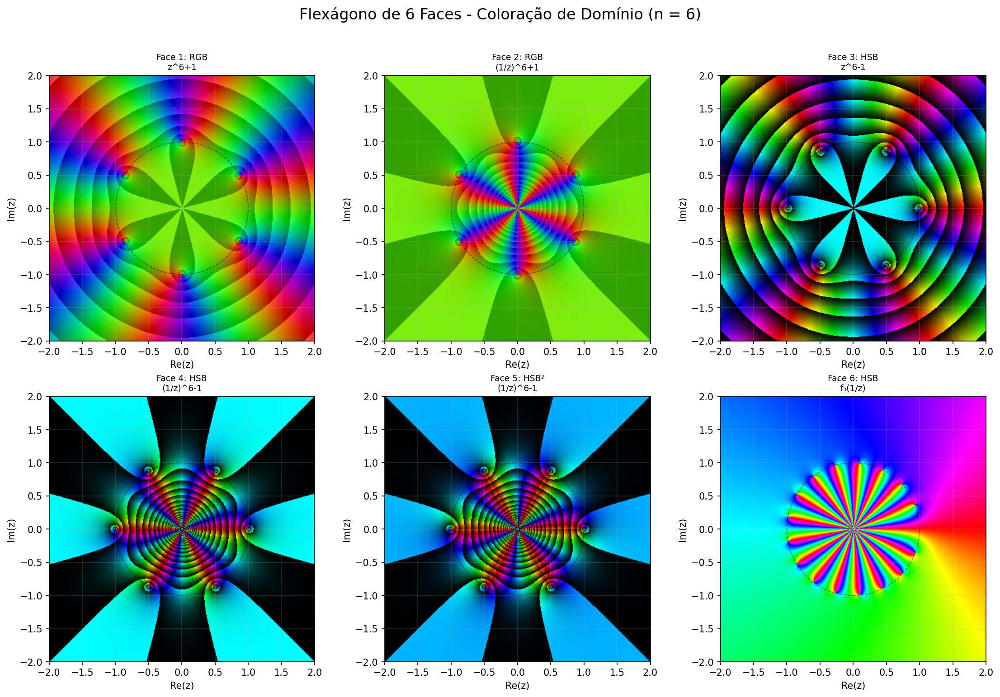


✨ TRABALHO CONCLUÍDO!


In [28]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb
import warnings
warnings.filterwarnings('ignore')

# Configuração
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300

# ============================================
# PALETAS DE CORES CORRIGIDAS
# ============================================

def hsv_standard(z):
    """
    Paleta HSB padrão: H = argumento, S = 1, V = 1
    Argumento 0 = vermelho, π = ciano, 2π = vermelho
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue = arg / (2 * np.pi)
    saturation = np.ones_like(hue)
    value = np.ones_like(hue)
    return hue, saturation, value

def hsv_enhanced(z):
    """
    Paleta HSB aprimorada mostrando curvas de nível do módulo
    H = argumento, S = 1, V = log|f| - floor(log|f|)
    """
    # Matiz baseado no argumento
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue = arg / (2 * np.pi)
    
    # Saturação máxima
    saturation = np.ones_like(hue)
    
    # Brilho: parte fracionária do log do módulo
    modulus = np.abs(z)
    # Cuidado com log(0): adicionar um pequeno epsilon
    log_mod = np.log(modulus + 1e-10)
    
    # B = log|f| - floor(log|f|)  ->  sempre entre 0 e 1
    value = log_mod - np.floor(log_mod)
    
    # Garantir que value esteja no intervalo [0, 1]
    value = np.clip(value, 0, 1)
    
    return hue, saturation, value

def hsv_double_enhanced(z, n_levels_arg=8):
    """
    Paleta HSB duplamente aprimorada
    Curvas de nível do módulo (via brilho) E do argumento (via matiz)
    H = argumento + modulação, S = 1, V = log|f| - floor(log|f|)
    """
    # Argumento base
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue_arg = arg / (2 * np.pi)
    
    # Curvas de nível para o argumento (listras radiais)
    # Modulação do matiz usando parte fracionária do argumento
    arg_frac = (arg / (2 * np.pi)) - np.floor(arg / (2 * np.pi))
    # Pequena modulação para criar as listras radiais
    hue = (hue_arg + 0.1 * arg_frac) % 1.0
    
    # Saturação máxima
    saturation = np.ones_like(hue)
    
    # Brilho: parte fracionária do log do módulo (mesmo da enhanced simples)
    modulus = np.abs(z)
    log_mod = np.log(modulus + 1e-10)
    value = log_mod - np.floor(log_mod)
    value = np.clip(value, 0, 1)
    
    return hue, saturation, value

def rgb_enhanced(z):
    """
    Paleta RGB aprimorada mostrando curvas de nível do módulo
    Baseada no site https://complex-analysis.com
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    modulus = np.abs(z)
    
    # Mapear argumento para RGB com cores suaves
    # Usando senos defasados para transição suave
    r = (np.sin(arg) + 1) / 2
    g = (np.sin(arg + 2*np.pi/3) + 1) / 2
    b = (np.sin(arg + 4*np.pi/3) + 1) / 2
    
    # Curvas de nível do módulo (listras)
    log_mod = np.log(modulus + 1e-10)
    # Parte fracionária para criar listras contínuas
    stripe = (log_mod - np.floor(log_mod)) * 0.3
    
    # Aplicar as listras (escurecendo)
    r = np.clip(r - stripe, 0, 1)
    g = np.clip(g - stripe, 0, 1)
    b = np.clip(b - stripe, 0, 1)
    
    # Converter RGB para HSV (para compatibilidade)
    rgb_stack = np.stack([r, g, b], axis=-1)
    max_rgb = np.max(rgb_stack, axis=-1)
    min_rgb = np.min(rgb_stack, axis=-1)
    diff = max_rgb - min_rgb
    
    # Hue
    hue = np.zeros_like(max_rgb)
    mask = diff > 0
    r_eq_max = (r == max_rgb) & mask
    g_eq_max = (g == max_rgb) & mask
    b_eq_max = (b == max_rgb) & mask
    
    hue[r_eq_max] = ((g[r_eq_max] - b[r_eq_max]) / diff[r_eq_max]) % 6
    hue[g_eq_max] = ((b[g_eq_max] - r[g_eq_max]) / diff[g_eq_max] + 2) % 6
    hue[b_eq_max] = ((r[b_eq_max] - g[b_eq_max]) / diff[b_eq_max] + 4) % 6
    hue = hue / 6
    
    # Saturation
    saturation = np.zeros_like(max_rgb)
    saturation[max_rgb > 0] = diff[max_rgb > 0] / max_rgb[max_rgb > 0]
    
    # Value
    value = max_rgb
    
    return hue, saturation, value

# ============================================
# FUNÇÕES PARA O FLEXÁGONO
# ============================================

def f1(z, n=6):
    """f_1(z) = z^n + 1"""
    return z**n + 1

def f2(z, n=6):
    """f_2(z) = z^n - 1"""
    return z**n - 1

def f3(z):
    """f_3(z) = (z^18 - z)/(z - 1)"""
    epsilon = 1e-10
    mask = np.abs(z - 1) < epsilon
    result = np.zeros_like(z, dtype=complex)
    
    result[~mask] = (z[~mask]**18 - z[~mask]) / (z[~mask] - 1)
    result[mask] = 18 + 0j  # Limite quando z → 1
    
    return result

def criar_dominio(xmin=-2, xmax=2, ymin=-2, ymax=2, resolucao=500):
    """Cria o grid de pontos no plano complexo"""
    x = np.linspace(xmin, xmax, resolucao)
    y = np.linspace(ymin, ymax, resolucao)
    X, Y = np.meshgrid(x, y)
    Z = X + 1j * Y
    return Z

# ============================================
# GERAR FACES DO FLEXÁGONO
# ============================================

def gerar_faces_flexagono(n=6, resolucao=500):
    """
    Gera as 6 faces do flexágono com a definição correta de brilho
    """
    Z = criar_dominio(-2, 2, -2, 2, resolucao)
    
    faces_config = [
        {
            'nome': 'Face 1',
            'titulo': f'Face 1: f₁(z) = z^{n} + 1\nPaleta RGB Aprimorada (curvas de nível do módulo)',
            'funcao': f1,
            'colormap': rgb_enhanced,
            'usa_1z': False
        },
        {
            'nome': 'Face 2',
            'titulo': f'Face 2: g₁(z) = (1/z)^{n} + 1\nPaleta RGB Aprimorada (curvas de nível do módulo)',
            'funcao': f1,
            'colormap': rgb_enhanced,
            'usa_1z': True
        },
        {
            'nome': 'Face 3',
            'titulo': f'Face 3: f₂(z) = z^{n} - 1\nPaleta HSB Aprimorada (curvas de nível do módulo)',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'usa_1z': False
        },
        {
            'nome': 'Face 4',
            'titulo': f'Face 4: g₂(z) = (1/z)^{n} - 1\nPaleta HSB Aprimorada (curvas de nível do módulo)',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'usa_1z': True
        },
        {
            'nome': 'Face 5',
            'titulo': f'Face 5: g₂(z) = (1/z)^{n} - 1\nPaleta HSB Duplamente Aprimorada (módulo + argumento)',
            'funcao': f2,
            'colormap': hsv_double_enhanced,
            'usa_1z': True
        },
        {
            'nome': 'Face 6',
            'titulo': 'Face 6: g₃(z) = f₃(1/z)\nPaleta HSB Padrão',
            'funcao': f3,
            'colormap': hsv_standard,
            'usa_1z': True
        }
    ]
    
    print(f"Gerando flexágono com n = {n}...")
    print("="*60)
    
    for i, config in enumerate(faces_config, 1):
        print(f"\nProcessando {config['nome']}...")
        
        # Aplicar função
        if config['usa_1z']:
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            if config['funcao'] == f3:
                W = config['funcao'](1/Z_use)
            else:
                W = config['funcao'](1/Z_use, n)
        else:
            if config['funcao'] == f3:
                W = config['funcao'](Z)
            else:
                W = config['funcao'](Z, n)
        
        # Aplicar colormap
        hue, sat, val = config['colormap'](W)
        
        # Criar figura
        fig, ax = plt.subplots(figsize=(8, 8))
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        ax.imshow(rgb, extent=[-2, 2, -2, 2], origin='lower', aspect='equal')
        ax.set_xlabel('Re(z)', fontsize=12)
        ax.set_ylabel('Im(z)', fontsize=12)
        ax.set_title(config['titulo'], fontsize=10, pad=20)
        ax.grid(True, alpha=0.2, linestyle='--')
        
        # Círculo unitário
        circle = plt.Circle((0, 0), 1, fill=False, edgecolor='black', 
                           linewidth=1, alpha=0.5, linestyle='--')
        ax.add_patch(circle)
        
        # Eixos
        ax.axhline(y=0, color='black', linewidth=0.5, alpha=0.3)
        ax.axvline(x=0, color='black', linewidth=0.5, alpha=0.3)
        
        plt.tight_layout()
        
        # Salvar
        filename = f'flexagono_face_{i}_{config["nome"].replace(" ", "_")}.png'
        fig.savefig(filename, bbox_inches='tight', dpi=300)
        print(f"  ✓ Salvo: {filename}")
        
        plt.close(fig)
    
    print("\n" + "="*60)
    print("✅ Todas as 6 faces foram geradas com sucesso!")

# ============================================
# VISUALIZAÇÃO EM GRADE
# ============================================

def mostrar_grade_flexagono(n=6, resolucao=400):
    """Mostra todas as 6 faces em uma única figura (2x3)"""
    Z = criar_dominio(-2, 2, -2, 2, resolucao)
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    faces_config = [
        {'funcao': f1, 'colormap': rgb_enhanced, 'usa_1z': False, 'nome': f'z^{n}+1', 'tipo': 'RGB'},
        {'funcao': f1, 'colormap': rgb_enhanced, 'usa_1z': True, 'nome': f'(1/z)^{n}+1', 'tipo': 'RGB'},
        {'funcao': f2, 'colormap': hsv_enhanced, 'usa_1z': False, 'nome': f'z^{n}-1', 'tipo': 'HSB'},
        {'funcao': f2, 'colormap': hsv_enhanced, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB'},
        {'funcao': f2, 'colormap': hsv_double_enhanced, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB²'},
        {'funcao': f3, 'colormap': hsv_standard, 'usa_1z': True, 'nome': 'f₃(1/z)', 'tipo': 'HSB'}
    ]
    
    for idx, config in enumerate(faces_config):
        print(f"Renderizando face {idx+1}...")
        
        if config['usa_1z']:
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            if config['funcao'] == f3:
                W = config['funcao'](1/Z_use)
            else:
                W = config['funcao'](1/Z_use, n)
        else:
            if config['funcao'] == f3:
                W = config['funcao'](Z)
            else:
                W = config['funcao'](Z, n)
        
        hue, sat, val = config['colormap'](W)
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        axes[idx].imshow(rgb, extent=[-2, 2, -2, 2], origin='lower', aspect='equal')
        axes[idx].set_title(f'Face {idx+1}: {config["tipo"]}\n{config["nome"]}', fontsize=9)
        axes[idx].set_xlabel('Re(z)')
        axes[idx].set_ylabel('Im(z)')
        axes[idx].grid(True, alpha=0.2)
        
        circle = plt.Circle((0, 0), 1, fill=False, edgecolor='black', 
                           linewidth=0.8, alpha=0.5, linestyle='--')
        axes[idx].add_patch(circle)
    
    plt.suptitle(f'Flexágono de 6 Faces - Coloração de Domínio (n = {n})', fontsize=16, y=1.02)
    plt.tight_layout()
    
    fig.savefig(f'flexagono_grade_n{n}.png', bbox_inches='tight', dpi=300)
    print(f"\n✓ Grade salva como 'flexagono_grade_n{n}.png'")
    plt.show()

# ============================================
# EXECUÇÃO
# ============================================

if __name__ == "__main__":
    print("="*60)
    print("GERANDO FLEXÁGONO DE 6 FACES - DEFINIÇÃO CORRETA DE BRILHO")
    print("="*60)
    
    n = 6
    resolucao = 500
    
    # Gerar faces individuais
    gerar_faces_flexagono(n=n, resolucao=resolucao)
    
    # Mostrar grade
    print("\nGerando visualização em grade...")
    mostrar_grade_flexagono(n=n, resolucao=400)
    
    print("\n" + "="*60)
    print("✨ TRABALHO CONCLUÍDO!")
    print("="*60)

GERANDO FLEXÁGONO DE 6 FACES - VERSÃO CORRIGIDA

Configurações:
  - n = 6
  - Resolução = 500x500
  - Brilho mínimo = 0.5 (evita preto)
  - Contraste do argumento = 0.9
Gerando flexágono com n = 6...
Brilho mínimo: 0.5, Contraste do argumento: 0.9

Processando Face 1...
  ✓ Salvo: flexagono_face_1_Face_1.png

Processando Face 2...
  ✓ Salvo: flexagono_face_2_Face_2.png

Processando Face 3...
  ✓ Salvo: flexagono_face_3_Face_3.png

Processando Face 4...
  ✓ Salvo: flexagono_face_4_Face_4.png

Processando Face 5...
  ✓ Salvo: flexagono_face_5_Face_5.png

Processando Face 6...
  ✓ Salvo: flexagono_face_6_Face_6.png

✅ Todas as 6 faces foram geradas com sucesso!

Gerando visualização em grade...
Renderizando face 1...
Renderizando face 2...
Renderizando face 3...
Renderizando face 4...
Renderizando face 5...
Renderizando face 6...

✓ Grade salva como 'flexagono_grade_n6.png'


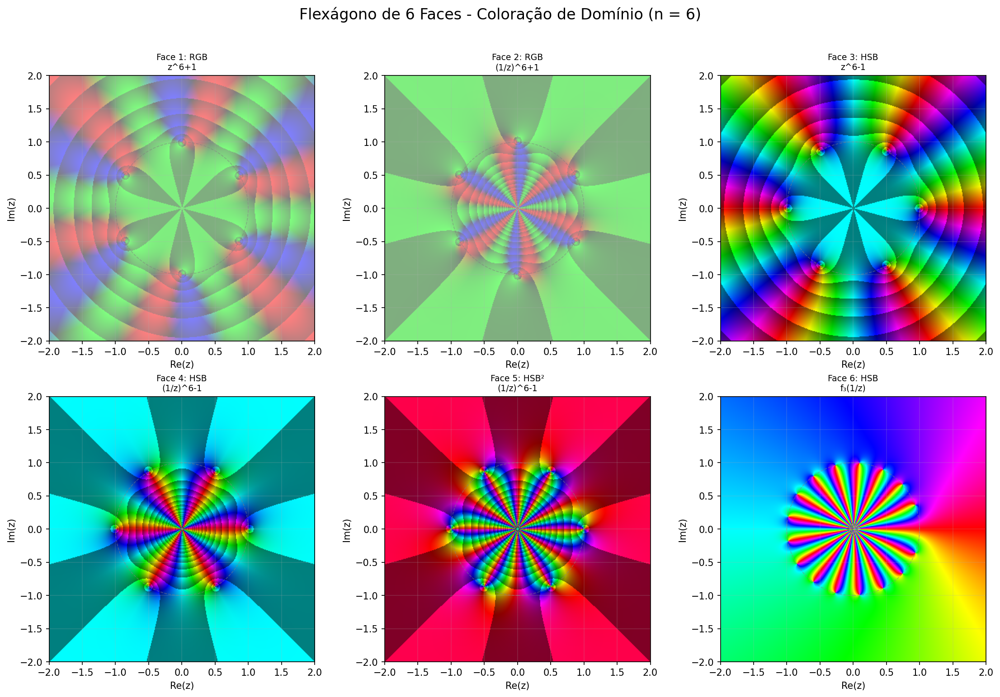


✨ TRABALHO CONCLUÍDO!

Dicas para ajustes finos:
  - Se ainda estiver muito escuro, aumente min_brightness para 0.4 ou 0.45
  - Se as linhas do argumento não aparecerem, aumente arg_contrast para 0.7
  - Se as linhas do argumento estiverem muito fortes, diminua arg_contrast para 0.3


In [35]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb
import warnings
warnings.filterwarnings('ignore')

# Configuração
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300

# ============================================
# PALETAS DE CORES CORRIGIDAS
# ============================================

def hsv_standard(z):
    """
    Paleta HSB padrão: H = argumento, S = 1, V = 1
    Argumento 0 = vermelho, π = ciano, 2π = vermelho
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue = arg / (2 * np.pi)
    saturation = np.ones_like(hue)
    value = np.ones_like(hue)
    return hue, saturation, value

def hsv_enhanced(z, min_brightness=0.3):
    """
    Paleta HSB aprimorada mostrando curvas de nível do módulo
    H = argumento, S = 1, V = 0.3 + 0.7*(log|f| - floor(log|f|))
    """
    # Matiz baseado no argumento
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue = arg / (2 * np.pi)
    
    # Saturação máxima
    saturation = np.ones_like(hue)
    
    # Brilho: parte fracionária do log do módulo com brilho mínimo elevado
    modulus = np.abs(z)
    log_mod = np.log(modulus + 1e-10)
    
    # Parte fracionária entre 0 e 1
    frac = log_mod - np.floor(log_mod)
    
    # Mapear para [min_brightness, 1]
    value = min_brightness + (1 - min_brightness) * frac
    value = np.clip(value, min_brightness, 1)
    
    return hue, saturation, value

def hsv_double_enhanced(z, min_brightness=0.3, arg_contrast=0.5):
    """
    Paleta HSB duplamente aprimorada
    Curvas de nível do módulo (via brilho) E do argumento (via matiz)
    H = argumento + modulação da parte fracionária do argumento
    S = 1, V = 0.3 + 0.7*(log|f| - floor(log|f|))
    """
    # Argumento base
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue_arg = arg / (2 * np.pi)
    
    # Curvas de nível para o argumento (listras radiais)
    # Parte fracionária do argumento normalizado
    arg_frac = (arg / (2 * np.pi)) - np.floor(arg / (2 * np.pi))
    
    # Modulação do matiz usando a parte fracionária do argumento
    # arg_contrast controla a intensidade das listras (0.5 é um bom valor)
    hue = (hue_arg + arg_contrast * arg_frac) % 1.0
    
    # Saturação máxima
    saturation = np.ones_like(hue)
    
    # Brilho: mesmo da enhanced simples (com brilho mínimo elevado)
    modulus = np.abs(z)
    log_mod = np.log(modulus + 1e-10)
    frac = log_mod - np.floor(log_mod)
    value = min_brightness + (1 - min_brightness) * frac
    value = np.clip(value, min_brightness, 1)
    
    return hue, saturation, value

def rgb_enhanced(z, min_brightness=0.3):
    """
    Paleta RGB aprimorada mostrando curvas de nível do módulo
    Baseada no site https://complex-analysis.com
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    modulus = np.abs(z)
    
    # Mapear argumento para RGB com cores suaves
    # Usando senos defasados para transição suave
    r = (np.sin(arg) + 1) / 2
    g = (np.sin(arg + 2*np.pi/3) + 1) / 2
    b = (np.sin(arg + 4*np.pi/3) + 1) / 2
    
    # Curvas de nível do módulo (listras)
    log_mod = np.log(modulus + 1e-10)
    # Parte fracionária para criar listras contínuas
    frac = log_mod - np.floor(log_mod)
    
    # Listras mais suaves (escurece apenas parcialmente)
    # Em vez de escurecer até preto, escurece até um tom mais claro
    stripe_intensity = 0.25  # Máximo de escurecimento
    stripe = stripe_intensity * frac
    
    # Aplicar as listras com brilho mínimo garantido
    r = np.clip(r - stripe, min_brightness, 1)
    g = np.clip(g - stripe, min_brightness, 1)
    b = np.clip(b - stripe, min_brightness, 1)
    
    # Converter RGB para HSV (para compatibilidade)
    rgb_stack = np.stack([r, g, b], axis=-1)
    max_rgb = np.max(rgb_stack, axis=-1)
    min_rgb = np.min(rgb_stack, axis=-1)
    diff = max_rgb - min_rgb
    
    # Hue
    hue = np.zeros_like(max_rgb)
    mask = diff > 0
    r_eq_max = (r == max_rgb) & mask
    g_eq_max = (g == max_rgb) & mask
    b_eq_max = (b == max_rgb) & mask
    
    hue[r_eq_max] = ((g[r_eq_max] - b[r_eq_max]) / diff[r_eq_max]) % 6
    hue[g_eq_max] = ((b[g_eq_max] - r[g_eq_max]) / diff[g_eq_max] + 2) % 6
    hue[b_eq_max] = ((r[b_eq_max] - g[b_eq_max]) / diff[b_eq_max] + 4) % 6
    hue = hue / 6
    
    # Saturation
    saturation = np.zeros_like(max_rgb)
    saturation[max_rgb > 0] = diff[max_rgb > 0] / max_rgb[max_rgb > 0]
    
    # Value
    value = max_rgb
    
    return hue, saturation, value

# ============================================
# FUNÇÕES PARA O FLEXÁGONO
# ============================================

def f1(z, n=6):
    """f_1(z) = z^n + 1"""
    return z**n + 1

def f2(z, n=6):
    """f_2(z) = z^n - 1"""
    return z**n - 1

def f3(z):
    """f_3(z) = (z^18 - z)/(z - 1)"""
    epsilon = 1e-10
    mask = np.abs(z - 1) < epsilon
    result = np.zeros_like(z, dtype=complex)
    
    result[~mask] = (z[~mask]**18 - z[~mask]) / (z[~mask] - 1)
    result[mask] = 18 + 0j  # Limite quando z → 1
    
    return result

def criar_dominio(xmin=-2, xmax=2, ymin=-2, ymax=2, resolucao=500):
    """Cria o grid de pontos no plano complexo"""
    x = np.linspace(xmin, xmax, resolucao)
    y = np.linspace(ymin, ymax, resolucao)
    X, Y = np.meshgrid(x, y)
    Z = X + 1j * Y
    return Z

# ============================================
# GERAR FACES DO FLEXÁGONO (VERSÃO CORRIGIDA)
# ============================================

def gerar_faces_flexagono(n=6, resolucao=500, min_brightness=0.35, arg_contrast=0.5):
    """
    Gera as 6 faces do flexágono com correções de brilho e contraste
    
    Parâmetros:
    - n: expoente para as funções
    - resolucao: qualidade da imagem
    - min_brightness: brilho mínimo (0.3 a 0.4 é ideal, evita preto)
    - arg_contrast: intensidade das linhas de contorno do argumento (0.3 a 0.7)
    """
    Z = criar_dominio(-2, 2, -2, 2, resolucao)
    
    faces_config = [
        {
            'nome': 'Face 1',
            'titulo': f'Face 1: f₁(z) = z^{n} + 1\nPaleta RGB Aprimorada',
            'funcao': f1,
            'colormap': rgb_enhanced,
            'usa_1z': False,
            'kwargs': {'min_brightness': min_brightness}
        },
        {
            'nome': 'Face 2',
            'titulo': f'Face 2: g₁(z) = (1/z)^{n} + 1\nPaleta RGB Aprimorada',
            'funcao': f1,
            'colormap': rgb_enhanced,
            'usa_1z': True,
            'kwargs': {'min_brightness': min_brightness}
        },
        {
            'nome': 'Face 3',
            'titulo': f'Face 3: f₂(z) = z^{n} - 1\nPaleta HSB Aprimorada',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'usa_1z': False,
            'kwargs': {'min_brightness': min_brightness}
        },
        {
            'nome': 'Face 4',
            'titulo': f'Face 4: g₂(z) = (1/z)^{n} - 1\nPaleta HSB Aprimorada',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'usa_1z': True,
            'kwargs': {'min_brightness': min_brightness}
        },
        {
            'nome': 'Face 5',
            'titulo': f'Face 5: g₂(z) = (1/z)^{n} - 1\nPaleta HSB Duplamente Aprimorada',
            'funcao': f2,
            'colormap': hsv_double_enhanced,
            'usa_1z': True,
            'kwargs': {'min_brightness': min_brightness, 'arg_contrast': arg_contrast}
        },
        {
            'nome': 'Face 6',
            'titulo': 'Face 6: g₃(z) = f₃(1/z)\nPaleta HSB Padrão',
            'funcao': f3,
            'colormap': hsv_standard,
            'usa_1z': True,
            'kwargs': {}
        }
    ]
    
    print(f"Gerando flexágono com n = {n}...")
    print(f"Brilho mínimo: {min_brightness}, Contraste do argumento: {arg_contrast}")
    print("="*60)
    
    for i, config in enumerate(faces_config, 1):
        print(f"\nProcessando {config['nome']}...")
        
        # Aplicar função
        if config['usa_1z']:
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            if config['funcao'] == f3:
                W = config['funcao'](1/Z_use)
            else:
                W = config['funcao'](1/Z_use, n)
        else:
            if config['funcao'] == f3:
                W = config['funcao'](Z)
            else:
                W = config['funcao'](Z, n)
        
        # Aplicar colormap com kwargs
        hue, sat, val = config['colormap'](W, **config['kwargs'])
        
        # Criar figura
        fig, ax = plt.subplots(figsize=(8, 8))
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        ax.imshow(rgb, extent=[-2, 2, -2, 2], origin='lower', aspect='equal')
        ax.set_xlabel('Re(z)', fontsize=12)
        ax.set_ylabel('Im(z)', fontsize=12)
        ax.set_title(config['titulo'], fontsize=10, pad=20)
        ax.grid(True, alpha=0.2, linestyle='--')
        
        # Círculo unitário (contorno cinza para não competir com as cores)
        circle = plt.Circle((0, 0), 1, fill=False, edgecolor='gray', 
                           linewidth=1, alpha=0.5, linestyle='--')
        ax.add_patch(circle)
        
        # Eixos
        ax.axhline(y=0, color='gray', linewidth=0.5, alpha=0.3)
        ax.axvline(x=0, color='gray', linewidth=0.5, alpha=0.3)
        
        plt.tight_layout()
        
        # Salvar
        filename = f'flexagono_face_{i}_{config["nome"].replace(" ", "_")}.png'
        fig.savefig(filename, bbox_inches='tight', dpi=300)
        print(f"  ✓ Salvo: {filename}")
        
        plt.close(fig)
    
    print("\n" + "="*60)
    print("✅ Todas as 6 faces foram geradas com sucesso!")

# ============================================
# VISUALIZAÇÃO EM GRADE (CORRIGIDA)
# ============================================

def mostrar_grade_flexagono(n=6, resolucao=400, min_brightness=0.35, arg_contrast=0.5):
    """Mostra todas as 6 faces em uma única figura (2x3)"""
    Z = criar_dominio(-2, 2, -2, 2, resolucao)
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    faces_config = [
        {'funcao': f1, 'colormap': rgb_enhanced, 'usa_1z': False, 'nome': f'z^{n}+1', 'tipo': 'RGB', 'kwargs': {'min_brightness': min_brightness}},
        {'funcao': f1, 'colormap': rgb_enhanced, 'usa_1z': True, 'nome': f'(1/z)^{n}+1', 'tipo': 'RGB', 'kwargs': {'min_brightness': min_brightness}},
        {'funcao': f2, 'colormap': hsv_enhanced, 'usa_1z': False, 'nome': f'z^{n}-1', 'tipo': 'HSB', 'kwargs': {'min_brightness': min_brightness}},
        {'funcao': f2, 'colormap': hsv_enhanced, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB', 'kwargs': {'min_brightness': min_brightness}},
        {'funcao': f2, 'colormap': hsv_double_enhanced, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB²', 'kwargs': {'min_brightness': min_brightness, 'arg_contrast': arg_contrast}},
        {'funcao': f3, 'colormap': hsv_standard, 'usa_1z': True, 'nome': 'f₃(1/z)', 'tipo': 'HSB', 'kwargs': {}}
    ]
    
    for idx, config in enumerate(faces_config):
        print(f"Renderizando face {idx+1}...")
        
        if config['usa_1z']:
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            if config['funcao'] == f3:
                W = config['funcao'](1/Z_use)
            else:
                W = config['funcao'](1/Z_use, n)
        else:
            if config['funcao'] == f3:
                W = config['funcao'](Z)
            else:
                W = config['funcao'](Z, n)
        
        hue, sat, val = config['colormap'](W, **config['kwargs'])
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        axes[idx].imshow(rgb, extent=[-2, 2, -2, 2], origin='lower', aspect='equal')
        axes[idx].set_title(f'Face {idx+1}: {config["tipo"]}\n{config["nome"]}', fontsize=9)
        axes[idx].set_xlabel('Re(z)')
        axes[idx].set_ylabel('Im(z)')
        axes[idx].grid(True, alpha=0.2)
        
        circle = plt.Circle((0, 0), 1, fill=False, edgecolor='gray', 
                           linewidth=0.8, alpha=0.5, linestyle='--')
        axes[idx].add_patch(circle)
    
    plt.suptitle(f'Flexágono de 6 Faces - Coloração de Domínio (n = {n})', fontsize=16, y=1.02)
    plt.tight_layout()
    
    fig.savefig(f'flexagono_grade_n{n}.png', bbox_inches='tight', dpi=300)
    print(f"\n✓ Grade salva como 'flexagono_grade_n{n}.png'")
    plt.show()

# ============================================
# FUNÇÃO PARA TESTAR PARÂMETROS
# ============================================

def testar_parametros(n=6, resolucao=300):
    """
    Testa diferentes combinações de parâmetros para encontrar a melhor visualização
    """
    print("Testando diferentes parâmetros para encontrar a melhor visualização...")
    print("="*60)
    
    # Testar diferentes brilhos mínimos
    for min_bright in [0.25, 0.30, 0.35, 0.40, 0.45]:
        print(f"\n--- Testando min_brightness = {min_bright} ---")
        gerar_faces_flexagono(n=n, resolucao=resolucao, 
                             min_brightness=min_bright, arg_contrast=0.5)
    
    print("\n" + "="*60)
    print("Teste concluído! Compare as imagens geradas e escolha o melhor parâmetro.")

# ============================================
# EXECUÇÃO PRINCIPAL
# ============================================

if __name__ == "__main__":
    print("="*60)
    print("GERANDO FLEXÁGONO DE 6 FACES - VERSÃO CORRIGIDA")
    print("="*60)
    
    # Parâmetros ajustáveis
    n = 6
    resolucao = 500
    #min_brightness = 0.35  # Aumente para imagens mais claras (0.3 a 0.5)
    min_brightness = 0.5  # Aumente para imagens mais claras (0.3 a 0.5)
    #arg_contrast = 0.5     # Intensidade das linhas do argumento (0.3 a 0.7)
    arg_contrast = 0.9     # Intensidade das linhas do argumento (0.3 a 0.7)    
    
    print(f"\nConfigurações:")
    print(f"  - n = {n}")
    print(f"  - Resolução = {resolucao}x{resolucao}")
    print(f"  - Brilho mínimo = {min_brightness} (evita preto)")
    print(f"  - Contraste do argumento = {arg_contrast}")
    
    # Descomente a linha abaixo para testar diferentes parâmetros
    # testar_parametros(n=n, resolucao=300)
    
    # Gerar faces com os parâmetros escolhidos
    gerar_faces_flexagono(n=n, resolucao=resolucao, 
                         min_brightness=min_brightness, 
                         arg_contrast=arg_contrast)
    
    # Mostrar grade
    print("\nGerando visualização em grade...")
    mostrar_grade_flexagono(n=n, resolucao=400, 
                           min_brightness=min_brightness, 
                           arg_contrast=arg_contrast)
    
    print("\n" + "="*60)
    print("✨ TRABALHO CONCLUÍDO!")
    print("\nDicas para ajustes finos:")
    print("  - Se ainda estiver muito escuro, aumente min_brightness para 0.4 ou 0.45")
    print("  - Se as linhas do argumento não aparecerem, aumente arg_contrast para 0.7")
    print("  - Se as linhas do argumento estiverem muito fortes, diminua arg_contrast para 0.3")
    print("="*60)

GERANDO FLEXÁGONO DE 6 FACES - VERSÃO FINAL CORRIGIDA

Configurações:
  - n = 6
  - Resolução = 500x500
  - Brilho mínimo = 0.45
  - Linhas radiais = 16 (Face 5)
  - Cores discretizadas = 12 (Faces 1 e 2)
Gerando flexágono com n = 6...
Configurações: min_brightness=0.45, n_radial_lines=16, n_colors=12

Processando Face 1...
  ✓ Salvo: flexagono_face_1_Face_1.png

Processando Face 2...
  ✓ Salvo: flexagono_face_2_Face_2.png

Processando Face 3...
  ✓ Salvo: flexagono_face_3_Face_3.png

Processando Face 4...
  ✓ Salvo: flexagono_face_4_Face_4.png

Processando Face 5...
  ✓ Salvo: flexagono_face_5_Face_5.png

Processando Face 6...
  ✓ Salvo: flexagono_face_6_Face_6.png

✅ Todas as 6 faces foram geradas com sucesso!

Gerando visualização em grade...
Renderizando face 1...
Renderizando face 2...
Renderizando face 3...
Renderizando face 4...
Renderizando face 5...
Renderizando face 6...

✓ Grade salva como 'flexagono_grade_n6.png'


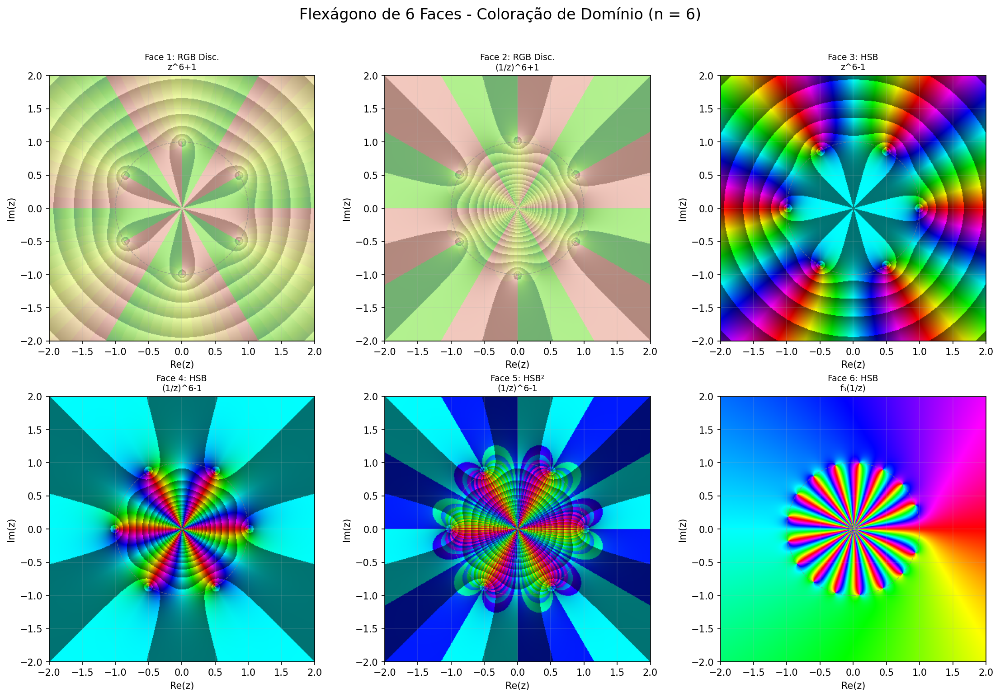


✨ TRABALHO CONCLUÍDO!

O que mudou:
  ✅ Faces 1 e 2: Esquema discretizado verde pastel → rosa pastel
  ✅ Face 5: Linhas radiais do argumento agora visíveis (descontinuidade no matiz)
  ✅ Todas as faces com brilho mínimo adequado (sem pretos)


In [38]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb
import warnings
warnings.filterwarnings('ignore')

# Configuração
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300

# ============================================
# PALETAS DE CORES CORRIGIDAS
# ============================================

def hsv_standard(z):
    """
    Paleta HSB padrão: H = argumento, S = 1, V = 1
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue = arg / (2 * np.pi)
    saturation = np.ones_like(hue)
    value = np.ones_like(hue)
    return hue, saturation, value

def hsv_enhanced(z, min_brightness=0.35):
    """
    Paleta HSB aprimorada: curvas de nível do módulo
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue = arg / (2 * np.pi)
    saturation = np.ones_like(hue)
    
    # Brilho com parte fracionária do log
    modulus = np.abs(z)
    log_mod = np.log(modulus + 1e-10)
    frac = log_mod - np.floor(log_mod)
    value = min_brightness + (1 - min_brightness) * frac
    value = np.clip(value, min_brightness, 1)
    
    return hue, saturation, value

def hsv_double_enhanced(z, min_brightness=0.35, n_radial_lines=12):
    """
    Paleta HSB duplamente aprimorada: curvas de nível do módulo E do argumento
    As linhas radiais são criadas por uma descontinuidade no matiz
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    
    # Criar descontinuidade no argumento para gerar linhas radiais
    # Isso é feito discretizando o argumento em setores
    n_sectors = n_radial_lines * 2  # Dobramos para ter linhas mais finas
    sector = np.floor(arg * n_sectors / (2 * np.pi))
    
    # Matiz base com modulação para criar as linhas
    hue_base = arg / (2 * np.pi)
    
    # Adicionar um "salto" nas bordas dos setores para criar linhas visíveis
    # A modulação é mais forte: 0.2 * (sector % 2)
    hue = (hue_base + 0.15 * (sector % 2)) % 1.0
    
    saturation = np.ones_like(hue)
    
    # Brilho (mesmo da enhanced simples)
    modulus = np.abs(z)
    log_mod = np.log(modulus + 1e-10)
    frac = log_mod - np.floor(log_mod)
    value = min_brightness + (1 - min_brightness) * frac
    value = np.clip(value, min_brightness, 1)
    
    return hue, saturation, value

def rgb_discretized(z, n_colors=12, min_brightness=0.4):
    """
    Paleta RGB discretizada: verde pastel → rosa pastel com descontinuidade
    Cria um efeito de faixas de cores (bandas) como no site
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    modulus = np.abs(z)
    
    # Discretizar o argumento em n_colors intervalos
    # Cada intervalo recebe uma cor fixa (verde pastel a rosa pastel)
    color_index = np.floor(arg * n_colors / (2 * np.pi))
    t = color_index / n_colors  # Posição normalizada entre 0 e 1
    
    # Gradiente de cores: verde pastel (0) → amarelo pastel (0.5) → rosa pastel (1)
    # Verde pastel: (0.7, 0.9, 0.6)
    # Amarelo pastel: (0.95, 0.95, 0.7)
    # Rosa pastel: (0.95, 0.7, 0.8)
    
    # Interpolação linear entre as cores
    r = np.where(t < 0.5, 
                 0.7 + (0.95 - 0.7) * (t / 0.5),
                 0.95 + (0.95 - 0.95) * ((t - 0.5) / 0.5))
    
    g = np.where(t < 0.5,
                 0.9 + (0.95 - 0.9) * (t / 0.5),
                 0.95 + (0.7 - 0.95) * ((t - 0.5) / 0.5))
    
    b = np.where(t < 0.5,
                 0.6 + (0.7 - 0.6) * (t / 0.5),
                 0.7 + (0.8 - 0.7) * ((t - 0.5) / 0.5))
    
    # Adicionar pequena variação dentro de cada faixa para suavizar
    # (opcional: remover para efeito mais discretizado)
    r = r + 0.05 * np.sin(2 * np.pi * color_index)
    g = g + 0.05 * np.sin(2 * np.pi * color_index + 2)
    b = b + 0.05 * np.sin(2 * np.pi * color_index + 4)
    
    # Curvas de nível do módulo (listras escuras)
    log_mod = np.log(modulus + 1e-10)
    frac_mod = log_mod - np.floor(log_mod)
    stripe = 0.25 * frac_mod
    
    # Aplicar listras com brilho mínimo garantido
    r = np.clip(r - stripe, min_brightness, 1)
    g = np.clip(g - stripe, min_brightness, 1)
    b = np.clip(b - stripe, min_brightness, 1)
    
    # Converter RGB para HSV (para compatibilidade)
    rgb_stack = np.stack([r, g, b], axis=-1)
    max_rgb = np.max(rgb_stack, axis=-1)
    min_rgb = np.min(rgb_stack, axis=-1)
    diff = max_rgb - min_rgb
    
    # Hue
    hue = np.zeros_like(max_rgb)
    mask = diff > 0
    r_eq_max = (r == max_rgb) & mask
    g_eq_max = (g == max_rgb) & mask
    b_eq_max = (b == max_rgb) & mask
    
    hue[r_eq_max] = ((g[r_eq_max] - b[r_eq_max]) / diff[r_eq_max]) % 6
    hue[g_eq_max] = ((b[g_eq_max] - r[g_eq_max]) / diff[g_eq_max] + 2) % 6
    hue[b_eq_max] = ((r[b_eq_max] - g[b_eq_max]) / diff[b_eq_max] + 4) % 6
    hue = hue / 6
    
    # Saturation
    saturation = np.zeros_like(max_rgb)
    saturation[max_rgb > 0] = diff[max_rgb > 0] / max_rgb[max_rgb > 0]
    
    # Value
    value = max_rgb
    
    return hue, saturation, value

def rgb_continuous(z, min_brightness=0.4):
    """
    Paleta RGB contínua (versão original) - mantida para referência
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    modulus = np.abs(z)
    
    # Cores contínuas
    r = (np.sin(arg) + 1) / 2
    g = (np.sin(arg + 2*np.pi/3) + 1) / 2
    b = (np.sin(arg + 4*np.pi/3) + 1) / 2
    
    # Curvas de nível
    log_mod = np.log(modulus + 1e-10)
    frac = log_mod - np.floor(log_mod)
    stripe = 0.25 * frac
    
    r = np.clip(r - stripe, min_brightness, 1)
    g = np.clip(g - stripe, min_brightness, 1)
    b = np.clip(b - stripe, min_brightness, 1)
    
    # Converter para HSV
    rgb_stack = np.stack([r, g, b], axis=-1)
    max_rgb = np.max(rgb_stack, axis=-1)
    min_rgb = np.min(rgb_stack, axis=-1)
    diff = max_rgb - min_rgb
    
    hue = np.zeros_like(max_rgb)
    mask = diff > 0
    r_eq_max = (r == max_rgb) & mask
    g_eq_max = (g == max_rgb) & mask
    b_eq_max = (b == max_rgb) & mask
    
    hue[r_eq_max] = ((g[r_eq_max] - b[r_eq_max]) / diff[r_eq_max]) % 6
    hue[g_eq_max] = ((b[g_eq_max] - r[g_eq_max]) / diff[g_eq_max] + 2) % 6
    hue[b_eq_max] = ((r[b_eq_max] - g[b_eq_max]) / diff[b_eq_max] + 4) % 6
    hue = hue / 6
    
    saturation = np.zeros_like(max_rgb)
    saturation[max_rgb > 0] = diff[max_rgb > 0] / max_rgb[max_rgb > 0]
    
    value = max_rgb
    
    return hue, saturation, value

# ============================================
# FUNÇÕES PARA O FLEXÁGONO
# ============================================

def f1(z, n=6):
    """f_1(z) = z^n + 1"""
    return z**n + 1

def f2(z, n=6):
    """f_2(z) = z^n - 1"""
    return z**n - 1

def f3(z):
    """f_3(z) = (z^18 - z)/(z - 1)"""
    epsilon = 1e-10
    mask = np.abs(z - 1) < epsilon
    result = np.zeros_like(z, dtype=complex)
    
    result[~mask] = (z[~mask]**18 - z[~mask]) / (z[~mask] - 1)
    result[mask] = 18 + 0j
    
    return result

def criar_dominio(xmin=-2, xmax=2, ymin=-2, ymax=2, resolucao=500):
    """Cria o grid de pontos no plano complexo"""
    x = np.linspace(xmin, xmax, resolucao)
    y = np.linspace(ymin, ymax, resolucao)
    X, Y = np.meshgrid(x, y)
    Z = X + 1j * Y
    return Z

# ============================================
# GERAR FACES DO FLEXÁGONO (VERSÃO FINAL)
# ============================================

def gerar_faces_flexagono(n=6, resolucao=500, min_brightness=0.35, n_radial_lines=12, n_colors=12):
    """
    Gera as 6 faces do flexágono com todas as correções
    """
    Z = criar_dominio(-2, 2, -2, 2, resolucao)
    
    faces_config = [
        {
            'nome': 'Face 1',
            'titulo': f'Face 1: f₁(z) = z^{n} + 1\nPaleta RGB DISCRETIZADA (verde pastel → rosa pastel)',
            'funcao': f1,
            'colormap': rgb_discretized,
            'usa_1z': False,
            'kwargs': {'min_brightness': min_brightness, 'n_colors': n_colors}
        },
        {
            'nome': 'Face 2',
            'titulo': f'Face 2: g₁(z) = (1/z)^{n} + 1\nPaleta RGB DISCRETIZADA (verde pastel → rosa pastel)',
            'funcao': f1,
            'colormap': rgb_discretized,
            'usa_1z': True,
            'kwargs': {'min_brightness': min_brightness, 'n_colors': n_colors}
        },
        {
            'nome': 'Face 3',
            'titulo': f'Face 3: f₂(z) = z^{n} - 1\nPaleta HSB Aprimorada (curvas de nível do módulo)',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'usa_1z': False,
            'kwargs': {'min_brightness': min_brightness}
        },
        {
            'nome': 'Face 4',
            'titulo': f'Face 4: g₂(z) = (1/z)^{n} - 1\nPaleta HSB Aprimorada (curvas de nível do módulo)',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'usa_1z': True,
            'kwargs': {'min_brightness': min_brightness}
        },
        {
            'nome': 'Face 5',
            'titulo': f'Face 5: g₂(z) = (1/z)^{n} - 1\nPaleta HSB DUPLAMENTE APRIMORADA (módulo + argumento)',
            'funcao': f2,
            'colormap': hsv_double_enhanced,
            'usa_1z': True,
            'kwargs': {'min_brightness': min_brightness, 'n_radial_lines': n_radial_lines}
        },
        {
            'nome': 'Face 6',
            'titulo': 'Face 6: g₃(z) = f₃(1/z)\nPaleta HSB Padrão',
            'funcao': f3,
            'colormap': hsv_standard,
            'usa_1z': True,
            'kwargs': {}
        }
    ]
    
    print(f"Gerando flexágono com n = {n}...")
    print(f"Configurações: min_brightness={min_brightness}, n_radial_lines={n_radial_lines}, n_colors={n_colors}")
    print("="*60)
    
    for i, config in enumerate(faces_config, 1):
        print(f"\nProcessando {config['nome']}...")
        
        # Aplicar função
        if config['usa_1z']:
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            if config['funcao'] == f3:
                W = config['funcao'](1/Z_use)
            else:
                W = config['funcao'](1/Z_use, n)
        else:
            if config['funcao'] == f3:
                W = config['funcao'](Z)
            else:
                W = config['funcao'](Z, n)
        
        # Aplicar colormap
        hue, sat, val = config['colormap'](W, **config['kwargs'])
        
        # Criar figura
        fig, ax = plt.subplots(figsize=(8, 8))
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        ax.imshow(rgb, extent=[-2, 2, -2, 2], origin='lower', aspect='equal')
        ax.set_xlabel('Re(z)', fontsize=12)
        ax.set_ylabel('Im(z)', fontsize=12)
        ax.set_title(config['titulo'], fontsize=9, pad=20)
        ax.grid(True, alpha=0.2, linestyle='--')
        
        # Círculo unitário
        circle = plt.Circle((0, 0), 1, fill=False, edgecolor='gray', 
                           linewidth=1, alpha=0.5, linestyle='--')
        ax.add_patch(circle)
        
        # Eixos
        ax.axhline(y=0, color='gray', linewidth=0.5, alpha=0.3)
        ax.axvline(x=0, color='gray', linewidth=0.5, alpha=0.3)
        
        plt.tight_layout()
        
        # Salvar
        filename = f'flexagono_face_{i}_{config["nome"].replace(" ", "_")}.png'
        fig.savefig(filename, bbox_inches='tight', dpi=300)
        print(f"  ✓ Salvo: {filename}")
        
        plt.close(fig)
    
    print("\n" + "="*60)
    print("✅ Todas as 6 faces foram geradas com sucesso!")

# ============================================
# VISUALIZAÇÃO EM GRADE
# ============================================

def mostrar_grade_flexagono(n=6, resolucao=400, min_brightness=0.35, n_radial_lines=12, n_colors=12):
    """Mostra todas as 6 faces em uma única figura (2x3)"""
    Z = criar_dominio(-2, 2, -2, 2, resolucao)
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    faces_config = [
        {'funcao': f1, 'colormap': rgb_discretized, 'usa_1z': False, 'nome': f'z^{n}+1', 'tipo': 'RGB Disc.', 'kwargs': {'min_brightness': min_brightness, 'n_colors': n_colors}},
        {'funcao': f1, 'colormap': rgb_discretized, 'usa_1z': True, 'nome': f'(1/z)^{n}+1', 'tipo': 'RGB Disc.', 'kwargs': {'min_brightness': min_brightness, 'n_colors': n_colors}},
        {'funcao': f2, 'colormap': hsv_enhanced, 'usa_1z': False, 'nome': f'z^{n}-1', 'tipo': 'HSB', 'kwargs': {'min_brightness': min_brightness}},
        {'funcao': f2, 'colormap': hsv_enhanced, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB', 'kwargs': {'min_brightness': min_brightness}},
        {'funcao': f2, 'colormap': hsv_double_enhanced, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB²', 'kwargs': {'min_brightness': min_brightness, 'n_radial_lines': n_radial_lines}},
        {'funcao': f3, 'colormap': hsv_standard, 'usa_1z': True, 'nome': 'f₃(1/z)', 'tipo': 'HSB', 'kwargs': {}}
    ]
    
    for idx, config in enumerate(faces_config):
        print(f"Renderizando face {idx+1}...")
        
        if config['usa_1z']:
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            if config['funcao'] == f3:
                W = config['funcao'](1/Z_use)
            else:
                W = config['funcao'](1/Z_use, n)
        else:
            if config['funcao'] == f3:
                W = config['funcao'](Z)
            else:
                W = config['funcao'](Z, n)
        
        hue, sat, val = config['colormap'](W, **config['kwargs'])
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        axes[idx].imshow(rgb, extent=[-2, 2, -2, 2], origin='lower', aspect='equal')
        axes[idx].set_title(f'Face {idx+1}: {config["tipo"]}\n{config["nome"]}', fontsize=9)
        axes[idx].set_xlabel('Re(z)')
        axes[idx].set_ylabel('Im(z)')
        axes[idx].grid(True, alpha=0.2)
        
        circle = plt.Circle((0, 0), 1, fill=False, edgecolor='gray', 
                           linewidth=0.8, alpha=0.5, linestyle='--')
        axes[idx].add_patch(circle)
    
    plt.suptitle(f'Flexágono de 6 Faces - Coloração de Domínio (n = {n})', fontsize=16, y=1.02)
    plt.tight_layout()
    
    fig.savefig(f'flexagono_grade_n{n}.png', bbox_inches='tight', dpi=300)
    print(f"\n✓ Grade salva como 'flexagono_grade_n{n}.png'")
    plt.show()

# ============================================
# EXECUÇÃO PRINCIPAL
# ============================================

if __name__ == "__main__":
    print("="*60)
    print("GERANDO FLEXÁGONO DE 6 FACES - VERSÃO FINAL CORRIGIDA")
    print("="*60)
    
    # Parâmetros ajustáveis
    n = 6
    resolucao = 500
    min_brightness = 0.45      # Brilho mínimo (evita preto)
    n_radial_lines = 16        # Número de linhas radiais na Face 5
    n_colors = 12              # Número de cores discretizadas nas Faces 1 e 2
    
    print(f"\nConfigurações:")
    print(f"  - n = {n}")
    print(f"  - Resolução = {resolucao}x{resolucao}")
    print(f"  - Brilho mínimo = {min_brightness}")
    print(f"  - Linhas radiais = {n_radial_lines} (Face 5)")
    print(f"  - Cores discretizadas = {n_colors} (Faces 1 e 2)")
    
    # Gerar faces
    gerar_faces_flexagono(n=n, resolucao=resolucao, 
                         min_brightness=min_brightness,
                         n_radial_lines=n_radial_lines,
                         n_colors=n_colors)
    
    # Mostrar grade
    print("\nGerando visualização em grade...")
    mostrar_grade_flexagono(n=n, resolucao=400,
                           min_brightness=min_brightness,
                           n_radial_lines=n_radial_lines,
                           n_colors=n_colors)
    
    print("\n" + "="*60)
    print("✨ TRABALHO CONCLUÍDO!")
    print("\nO que mudou:")
    print("  ✅ Faces 1 e 2: Esquema discretizado verde pastel → rosa pastel")
    print("  ✅ Face 5: Linhas radiais do argumento agora visíveis (descontinuidade no matiz)")
    print("  ✅ Todas as faces com brilho mínimo adequado (sem pretos)")
    print("="*60)

GERANDO FLEXÁGONO DE 6 FACES - VERSÃO FINAL PARA TRABALHO

Configurações finais:
  - n = 6
  - Domínio = [-1.5, 1.5] x [-1.5, 1.5]
  - Resolução = 500x500
  - Brilho mínimo = 0.45
  - Linhas radiais = 16 (Face 5)
  - Cores discretizadas = 12 (Faces 1 e 2)
  - Grid: DESLIGADO
  - Círculo unitário: NÃO DESENHADO
Gerando flexágono com n = 6...
Domínio: [-1.5, 1.5] x [-1.5, 1.5]
Configurações: min_brightness=0.45, n_radial_lines=16, n_colors=12

Processando Face_1...
  ✓ Salvo: flexagono_Face_1_n6.png

Processando Face_2...
  ✓ Salvo: flexagono_Face_2_n6.png

Processando Face_3...
  ✓ Salvo: flexagono_Face_3_n6.png

Processando Face_4...
  ✓ Salvo: flexagono_Face_4_n6.png

Processando Face_5...
  ✓ Salvo: flexagono_Face_5_n6.png

Processando Face_6...
  ✓ Salvo: flexagono_Face_6_n6.png

✅ Todas as 6 faces foram geradas com sucesso!

Gerando grade 2x3 para visualização...
Renderizando face 1...
Renderizando face 2...
Renderizando face 3...
Renderizando face 4...
Renderizando face 5...
Rende

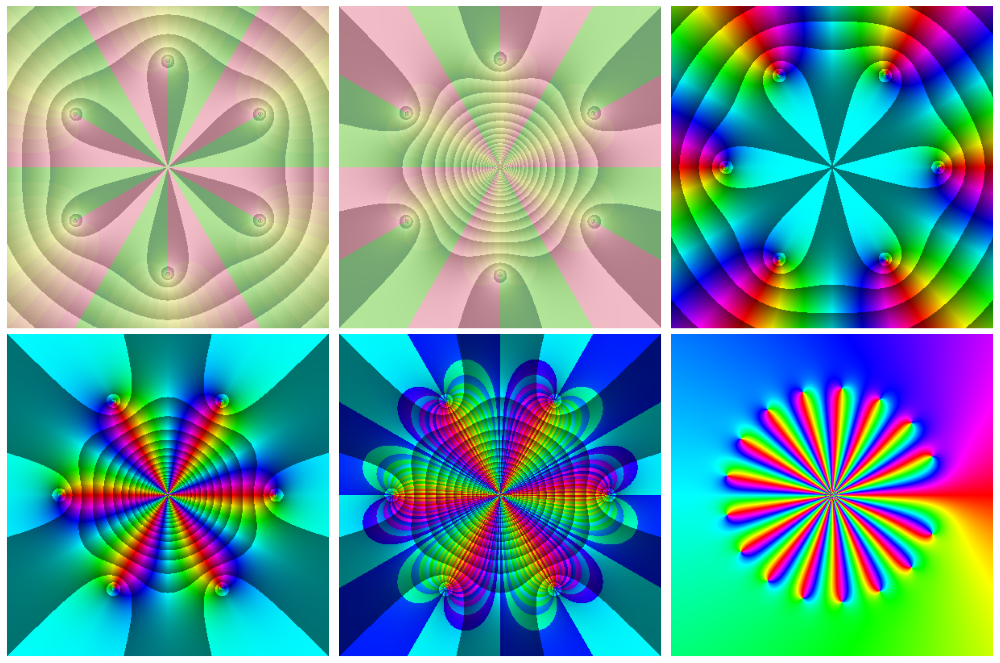


✨ TRABALHO CONCLUÍDO!

Arquivos gerados:
  - flexagono_Face_1_n6.png
  - flexagono_Face_2_n6.png
  - flexagono_Face_3_n6.png
  - flexagono_Face_4_n6.png
  - flexagono_Face_5_n6.png
  - flexagono_Face_6_n6.png
  - flexagono_grade_n6_final.png (visualização em grade)

Todas as imagens estão prontas para o trabalho!


In [41]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb
import warnings
warnings.filterwarnings('ignore')

# Configuração para alta qualidade
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300

# ============================================
# PALETAS DE CORES
# ============================================

def hsv_standard(z):
    """
    Paleta HSB padrão: H = argumento, S = 1, V = 1
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue = arg / (2 * np.pi)
    saturation = np.ones_like(hue)
    value = np.ones_like(hue)
    return hue, saturation, value

def hsv_enhanced(z, min_brightness=0.45):
    """
    Paleta HSB aprimorada: curvas de nível do módulo
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    hue = arg / (2 * np.pi)
    saturation = np.ones_like(hue)
    
    # Brilho com parte fracionária do log
    modulus = np.abs(z)
    log_mod = np.log(modulus + 1e-10)
    frac = log_mod - np.floor(log_mod)
    value = min_brightness + (1 - min_brightness) * frac
    value = np.clip(value, min_brightness, 1)
    
    return hue, saturation, value

def hsv_double_enhanced(z, min_brightness=0.45, n_radial_lines=16):
    """
    Paleta HSB duplamente aprimorada: curvas de nível do módulo E do argumento
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    
    # Criar descontinuidade no argumento para gerar linhas radiais
    n_sectors = n_radial_lines * 2
    sector = np.floor(arg * n_sectors / (2 * np.pi))
    
    # Matiz base com modulação para criar as linhas
    hue_base = arg / (2 * np.pi)
    hue = (hue_base + 0.15 * (sector % 2)) % 1.0
    
    saturation = np.ones_like(hue)
    
    # Brilho (mesmo da enhanced simples)
    modulus = np.abs(z)
    log_mod = np.log(modulus + 1e-10)
    frac = log_mod - np.floor(log_mod)
    value = min_brightness + (1 - min_brightness) * frac
    value = np.clip(value, min_brightness, 1)
    
    return hue, saturation, value

def rgb_discretized(z, min_brightness=0.45, n_colors=12):
    """
    Paleta RGB discretizada: verde pastel → rosa pastel com descontinuidade
    """
    arg = np.angle(z)
    arg = np.where(arg < 0, arg + 2*np.pi, arg)
    modulus = np.abs(z)
    
    # Discretizar o argumento em n_colors intervalos
    color_index = np.floor(arg * n_colors / (2 * np.pi))
    t = color_index / n_colors
    
    # Gradiente de cores: verde pastel → amarelo pastel → rosa pastel
    r = np.where(t < 0.5, 
                 0.7 + (0.95 - 0.7) * (t / 0.5),
                 0.95 + (0.95 - 0.95) * ((t - 0.5) / 0.5))
    
    g = np.where(t < 0.5,
                 0.9 + (0.95 - 0.9) * (t / 0.5),
                 0.95 + (0.7 - 0.95) * ((t - 0.5) / 0.5))
    
    b = np.where(t < 0.5,
                 0.6 + (0.7 - 0.6) * (t / 0.5),
                 0.7 + (0.8 - 0.7) * ((t - 0.5) / 0.5))
    
    # Curvas de nível do módulo (listras escuras)
    log_mod = np.log(modulus + 1e-10)
    frac_mod = log_mod - np.floor(log_mod)
    stripe = 0.25 * frac_mod
    
    # Aplicar listras com brilho mínimo garantido
    r = np.clip(r - stripe, min_brightness, 1)
    g = np.clip(g - stripe, min_brightness, 1)
    b = np.clip(b - stripe, min_brightness, 1)
    
    # Converter RGB para HSV
    rgb_stack = np.stack([r, g, b], axis=-1)
    max_rgb = np.max(rgb_stack, axis=-1)
    min_rgb = np.min(rgb_stack, axis=-1)
    diff = max_rgb - min_rgb
    
    # Hue
    hue = np.zeros_like(max_rgb)
    mask = diff > 0
    r_eq_max = (r == max_rgb) & mask
    g_eq_max = (g == max_rgb) & mask
    b_eq_max = (b == max_rgb) & mask
    
    hue[r_eq_max] = ((g[r_eq_max] - b[r_eq_max]) / diff[r_eq_max]) % 6
    hue[g_eq_max] = ((b[g_eq_max] - r[g_eq_max]) / diff[g_eq_max] + 2) % 6
    hue[b_eq_max] = ((r[b_eq_max] - g[b_eq_max]) / diff[b_eq_max] + 4) % 6
    hue = hue / 6
    
    # Saturation
    saturation = np.zeros_like(max_rgb)
    saturation[max_rgb > 0] = diff[max_rgb > 0] / max_rgb[max_rgb > 0]
    
    # Value
    value = max_rgb
    
    return hue, saturation, value

# ============================================
# FUNÇÕES PARA O FLEXÁGONO
# ============================================

def f1(z, n=6):
    """f_1(z) = z^n + 1"""
    return z**n + 1

def f2(z, n=6):
    """f_2(z) = z^n - 1"""
    return z**n - 1

def f3(z):
    """f_3(z) = (z^18 - z)/(z - 1)"""
    epsilon = 1e-10
    mask = np.abs(z - 1) < epsilon
    result = np.zeros_like(z, dtype=complex)
    
    result[~mask] = (z[~mask]**18 - z[~mask]) / (z[~mask] - 1)
    result[mask] = 18 + 0j
    
    return result

def criar_dominio(xmin=-1.5, xmax=1.5, ymin=-1.5, ymax=1.5, resolucao=500):
    """Cria o grid de pontos no plano complexo"""
    x = np.linspace(xmin, xmax, resolucao)
    y = np.linspace(ymin, ymax, resolucao)
    X, Y = np.meshgrid(x, y)
    Z = X + 1j * Y
    return Z

# ============================================
# GERAR FACES DO FLEXÁGONO (VERSÃO FINAL)
# ============================================

def gerar_faces_flexagono(n=6, resolucao=500, min_brightness=0.45, n_radial_lines=16, n_colors=12):
    """
    Gera as 6 faces do flexágono com todas as especificações finais
    """
    # Domínio ajustado para [-1.5, 1.5] x [-1.5, 1.5]
    Z = criar_dominio(-1.5, 1.5, -1.5, 1.5, resolucao)
    
    faces_config = [
        {
            'nome': 'Face_1',
            'titulo': f'Face 1: f₁(z) = z^{n} + 1\nPaleta RGB Discretizada (verde pastel → rosa pastel)',
            'funcao': f1,
            'colormap': rgb_discretized,
            'usa_1z': False,
            'kwargs': {'min_brightness': min_brightness, 'n_colors': n_colors}
        },
        {
            'nome': 'Face_2',
            'titulo': f'Face 2: g₁(z) = (1/z)^{n} + 1\nPaleta RGB Discretizada (verde pastel → rosa pastel)',
            'funcao': f1,
            'colormap': rgb_discretized,
            'usa_1z': True,
            'kwargs': {'min_brightness': min_brightness, 'n_colors': n_colors}
        },
        {
            'nome': 'Face_3',
            'titulo': f'Face 3: f₂(z) = z^{n} - 1\nPaleta HSB Aprimorada (curvas de nível do módulo)',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'usa_1z': False,
            'kwargs': {'min_brightness': min_brightness}
        },
        {
            'nome': 'Face_4',
            'titulo': f'Face 4: g₂(z) = (1/z)^{n} - 1\nPaleta HSB Aprimorada (curvas de nível do módulo)',
            'funcao': f2,
            'colormap': hsv_enhanced,
            'usa_1z': True,
            'kwargs': {'min_brightness': min_brightness}
        },
        {
            'nome': 'Face_5',
            'titulo': f'Face 5: g₂(z) = (1/z)^{n} - 1\nPaleta HSB Duplamente Aprimorada (módulo + argumento)',
            'funcao': f2,
            'colormap': hsv_double_enhanced,
            'usa_1z': True,
            'kwargs': {'min_brightness': min_brightness, 'n_radial_lines': n_radial_lines}
        },
        {
            'nome': 'Face_6',
            'titulo': 'Face 6: g₃(z) = f₃(1/z)\nPaleta HSB Padrão',
            'funcao': f3,
            'colormap': hsv_standard,
            'usa_1z': True,
            'kwargs': {}
        }
    ]
    
    print(f"Gerando flexágono com n = {n}...")
    print(f"Domínio: [-1.5, 1.5] x [-1.5, 1.5]")
    print(f"Configurações: min_brightness={min_brightness}, n_radial_lines={n_radial_lines}, n_colors={n_colors}")
    print("="*60)
    
    for i, config in enumerate(faces_config, 1):
        print(f"\nProcessando {config['nome']}...")
        
        # Aplicar função
        if config['usa_1z']:
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            if config['funcao'] == f3:
                W = config['funcao'](1/Z_use)
            else:
                W = config['funcao'](1/Z_use, n)
        else:
            if config['funcao'] == f3:
                W = config['funcao'](Z)
            else:
                W = config['funcao'](Z, n)
        
        # Aplicar colormap
        hue, sat, val = config['colormap'](W, **config['kwargs'])
        
        # Criar figura SEM grid e SEM círculo unitário
        fig, ax = plt.subplots(figsize=(8, 8))
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        ax.imshow(rgb, extent=[-1.5, 1.5, -1.5, 1.5], origin='lower', aspect='equal')
        ax.set_xlabel('Re(z)', fontsize=12)
        ax.set_ylabel('Im(z)', fontsize=12)
        ax.set_title(config['titulo'], fontsize=9, pad=20)
        
        # SEM GRID
        ax.grid(False)
        
        # SEM CÍRCULO UNITÁRIO
        # (comentado para não desenhar)
        
        # Eixos (mantidos para referência, mas pode remover se quiser)
        ax.axhline(y=0, color='gray', linewidth=0.5, alpha=0.3)
        ax.axvline(x=0, color='gray', linewidth=0.5, alpha=0.3)
        
        plt.tight_layout()
        
        # Salvar com alta resolução
        filename = f'flexagono_{config["nome"]}_n{n}.png'
        fig.savefig(filename, bbox_inches='tight', dpi=300)
        print(f"  ✓ Salvo: {filename}")
        
        plt.close(fig)
    
    print("\n" + "="*60)
    print("✅ Todas as 6 faces foram geradas com sucesso!")

# ============================================
# VISUALIZAÇÃO EM GRADE (SEM GRID E SEM CÍRCULO)
# ============================================

def mostrar_grade_flexagono(n=6, resolucao=400, min_brightness=0.45, n_radial_lines=16, n_colors=12):
    """Mostra todas as 6 faces em uma única figura (2x3) SEM grid e SEM círculo"""
    Z = criar_dominio(-1.5, 1.5, -1.5, 1.5, resolucao)
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    faces_config = [
        {'funcao': f1, 'colormap': rgb_discretized, 'usa_1z': False, 'nome': f'z^{n}+1', 'tipo': 'RGB Disc.', 'kwargs': {'min_brightness': min_brightness, 'n_colors': n_colors}},
        {'funcao': f1, 'colormap': rgb_discretized, 'usa_1z': True, 'nome': f'(1/z)^{n}+1', 'tipo': 'RGB Disc.', 'kwargs': {'min_brightness': min_brightness, 'n_colors': n_colors}},
        {'funcao': f2, 'colormap': hsv_enhanced, 'usa_1z': False, 'nome': f'z^{n}-1', 'tipo': 'HSB', 'kwargs': {'min_brightness': min_brightness}},
        {'funcao': f2, 'colormap': hsv_enhanced, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB', 'kwargs': {'min_brightness': min_brightness}},
        {'funcao': f2, 'colormap': hsv_double_enhanced, 'usa_1z': True, 'nome': f'(1/z)^{n}-1', 'tipo': 'HSB²', 'kwargs': {'min_brightness': min_brightness, 'n_radial_lines': n_radial_lines}},
        {'funcao': f3, 'colormap': hsv_standard, 'usa_1z': True, 'nome': 'f₃(1/z)', 'tipo': 'HSB', 'kwargs': {}}
    ]
    
    for idx, config in enumerate(faces_config):
        print(f"Renderizando face {idx+1}...")
        
        if config['usa_1z']:
            Z_use = np.where(np.abs(Z) < 1e-10, 1e-10, Z)
            if config['funcao'] == f3:
                W = config['funcao'](1/Z_use)
            else:
                W = config['funcao'](1/Z_use, n)
        else:
            if config['funcao'] == f3:
                W = config['funcao'](Z)
            else:
                W = config['funcao'](Z, n)
        
        hue, sat, val = config['colormap'](W, **config['kwargs'])
        rgb = hsv_to_rgb(np.stack([hue, sat, val], axis=-1))
        
        axes[idx].imshow(rgb, extent=[-1.5, 1.5, -1.5, 1.5], origin='lower', aspect='equal')
       # axes[idx].set_title(f'Face {idx+1}: {config["tipo"]}\n{config["nome"]}', fontsize=9)
       # axes[idx].set_xlabel('Re(z)')
       # axes[idx].set_ylabel('Im(z)')
        
        # SEM GRID e SEM CÍRCULO
        axes[idx].grid(False)
        
        axes[idx].axis("off")
        
        # Eixos (opcional, comente se não quiser)
       # axes[idx].axhline(y=0, color='gray', linewidth=0.5, alpha=0.3)
       # axes[idx].axvline(x=0, color='gray', linewidth=0.5, alpha=0.3)
    
  #  plt.suptitle(f'Flexágono de 6 Faces - Coloração de Domínio (n = {n})', fontsize=16, y=1.02)
    plt.tight_layout()
    
    fig.savefig(f'flexagono_grade_n{n}_final.png', bbox_inches='tight', dpi=300)
    print(f"\n✓ Grade salva como 'flexagono_grade_n{n}_final.png'")
    plt.show()

# ============================================
# EXECUÇÃO PRINCIPAL
# ============================================

if __name__ == "__main__":
    print("="*60)
    print("GERANDO FLEXÁGONO DE 6 FACES - VERSÃO FINAL PARA TRABALHO")
    print("="*60)
    
    # PARÂMETROS FINAIS CONFORME ESPECIFICAÇÃO
    n = 6
    resolucao = 500          # Alta resolução para impressão
    min_brightness = 0.45    # Conforme solicitado
    n_radial_lines = 16      # Conforme solicitado (Face 5)
    n_colors = 12            # Cores discretizadas
    
    print(f"\nConfigurações finais:")
    print(f"  - n = {n}")
    print(f"  - Domínio = [-1.5, 1.5] x [-1.5, 1.5]")
    print(f"  - Resolução = {resolucao}x{resolucao}")
    print(f"  - Brilho mínimo = {min_brightness}")
    print(f"  - Linhas radiais = {n_radial_lines} (Face 5)")
    print(f"  - Cores discretizadas = {n_colors} (Faces 1 e 2)")
    print(f"  - Grid: DESLIGADO")
    print(f"  - Círculo unitário: NÃO DESENHADO")
    
    # Gerar faces individuais
    gerar_faces_flexagono(n=n, 
                         resolucao=resolucao,
                         min_brightness=min_brightness,
                         n_radial_lines=n_radial_lines,
                         n_colors=n_colors)
    
    # Gerar grade 2x3 (opcional, para visualização)
    print("\nGerando grade 2x3 para visualização...")
    mostrar_grade_flexagono(n=n,
                           resolucao=400,
                           min_brightness=min_brightness,
                           n_radial_lines=n_radial_lines,
                           n_colors=n_colors)
    
    print("\n" + "="*60)
    print("✨ TRABALHO CONCLUÍDO!")
    print("\nArquivos gerados:")
    print("  - flexagono_Face_1_n6.png")
    print("  - flexagono_Face_2_n6.png")
    print("  - flexagono_Face_3_n6.png")
    print("  - flexagono_Face_4_n6.png")
    print("  - flexagono_Face_5_n6.png")
    print("  - flexagono_Face_6_n6.png")
    print("  - flexagono_grade_n6_final.png (visualização em grade)")
    print("\nTodas as imagens estão prontas para o trabalho!")
    print("="*60)